# Sector Analysis Pipeline Documentation

## Overview
This codebase implements a comprehensive sector analysis pipeline that processes market cap and revenue data, calculates various sector indices, performs clustering analysis, and builds a neural network classifier for sector categorization.


IMPORTING LIBRARIES

In [1]:
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
import os
import seaborn as sns
import numpy as np
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances_argmin_min
import warnings
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

Matplotlib is building the font cache; this may take a moment.


## Stage 1: Data Processing and Index Calculation

### Core Functions

#### `calculate_yoy_growth(df)`
- **Purpose**: Calculates Year-over-Year (YoY) growth for Market Cap
- **Input**: DataFrame with MarketCap column
- **Output**: DataFrame with added YoY_Growth column
- **Key Operations**:
  - Calculates percentage change over 4 periods (quarterly data)
  - Removes rows with NaN growth values


In [2]:
def calculate_yoy_growth(df):
    """Calculate the Year-over-Year (YoY) growth for Market Cap."""
    df['YoY_Growth'] = df['MarketCap'].pct_change(periods=4) * 100  # YoY percentage change
    df.dropna(subset=['YoY_Growth'], inplace=True)  # Drop rows with NaN YoY growth
    return df

#### `apply_log10_transformation(df)`
- **Purpose**: Applies logarithmic transformation to YoY growth
- **Input**: DataFrame with YoY_Growth column
- **Output**: DataFrame with added Log_YoY_Growth column
- **Note**: Adds 100 to handle negative growth values before log transformation



In [3]:
def apply_log10_transformation(df):
    """Apply log10 transformation to the YoY growth."""
    df['Log_YoY_Growth'] = np.log10(df['YoY_Growth'] + 100)  # log10(1 + YoY_Growth) to handle negative growth
    return df

#### `calculate_sector_leader_and_rank(df, sector)`
- **Purpose**: Identifies sector leaders and rankings based on performance
- **Input**: 
  - DataFrame with sector data
  - Sector name
- **Output**: 
  - Sector leader ticker
  - Sorted companies by performance
  - Total overperformance metric
- **Key Operations**:
  - Calculates sector average performance
  - Counts times each company outperforms sector average
  - Ranks companies by overperformance


In [4]:
def calculate_sector_leader_and_rank(df, sector):
    """Calculate the leader and performance ranking for a sector."""
    sector_avg = df.groupby('Date')['YoY_Growth'].mean()
    overperformance_counts = {}
    
    for ticker in df['Ticker'].unique():
        company_data = df[df['Ticker'] == ticker]
        company_data = company_data.set_index('Date')
        company_data['Sector_Avg'] = sector_avg
        
        overperformance_count = (company_data['YoY_Growth'] > company_data['Sector_Avg']).sum()
        overperformance_counts[ticker] = overperformance_count

    sorted_companies = sorted(overperformance_counts.items(), key=lambda x: x[1], reverse=True)

    sector_leader = sorted_companies[0][0]
    
    total_overperformance = sum([count**2 for _, count in sorted_companies])

    print(f"Leader for {sector} sector: {sector_leader}")
    print(f"Descending order of companies by overperformance in {sector} sector:")
    for company, count in sorted_companies:
        print(f"{company}: {count} times overperformed")
    
    return sector_leader, sorted_companies, total_overperformance

#### `calculate_sector_index(df, sorted_companies, total_overperformance)`
- **Purpose**: Creates weighted sector index based on company performance
- **Input**: 
  - Sector DataFrame
  - Sorted companies list
  - Total overperformance score
- **Output**: DataFrame with Date and Sector_Index columns
- **Key Operations**:
  - Calculates fractional contributions
  - Applies weights to company performance
  - Aggregates weighted performances

In [5]:

def calculate_sector_index(df, sorted_companies, total_overperformance):
    """Calculate the sector index based on fractional contribution of stocks."""
    fractional_contribution = {company: count**2 / total_overperformance for company, count in sorted_companies}
    
    sector_index = pd.DataFrame()
    
    for ticker in df['Ticker'].unique():
        company_data = df[df['Ticker'] == ticker].copy()
        
        if ticker in fractional_contribution:
            contribution = fractional_contribution[ticker]
            company_data['Weighted_YoY_Growth'] = company_data['YoY_Growth'] * contribution
        else:
            continue

        if sector_index.empty:
            sector_index = company_data[['Date', 'Weighted_YoY_Growth']].copy()
        else:
            sector_index = pd.merge(sector_index, company_data[['Date', 'Weighted_YoY_Growth']],
                                    on='Date', how='outer', suffixes=('', f'_{ticker}'))

    sector_index['Sector_Index'] = sector_index.filter(like='Weighted_YoY_Growth').sum(axis=1)

    return sector_index[['Date', 'Sector_Index']]

def calculate_simple_average_index(df):
    """Calculate sector index using simple average of YoY growth."""
    simple_avg_index = df.groupby('Date')['YoY_Growth'].mean().reset_index()
    simple_avg_index.rename(columns={'YoY_Growth': 'Simple_Avg_Index'}, inplace=True)
    return simple_avg_index

def plot_sector_index(sector_index, simple_avg_index, df, sector):
    """Plot the sector index (weighted and simple average) and stock values."""
    if sector_index.empty:
        print(f"No data to plot for {sector}.")
        return

    # Set up the plot
    plt.figure(figsize=(12, 8))

    # Plot contributing stock YoY values
    unique_tickers = df['Ticker'].unique()
    for ticker in unique_tickers:
        company_data = df[df['Ticker'] == ticker]
        plt.plot(company_data['Date'], company_data['YoY_Growth'], label=f"{ticker} YoY Growth", linestyle='--')

    # Plot weighted sector index
    plt.plot(sector_index['Date'], sector_index['Sector_Index'], label=f'{sector} Weighted Sector Index', color='blue', linewidth=2)

    # Plot simple average sector index
    plt.plot(simple_avg_index['Date'], simple_avg_index['Simple_Avg_Index'], label=f'{sector} Simple Average Index', color='red', linewidth=2)

    plt.title(f'Sector Index for {sector} Sector (Weighted vs Simple Average)')
    plt.xlabel('Date')
    plt.ylabel('YoY Growth / Index Value')
    plt.legend(loc='best')
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

EXECUTION OF STAGE-1

Processing Retail REITs sector...
Leader for Retail REITs sector: SPG
Descending order of companies by overperformance in Retail REITs sector:
SPG: 11 times overperformed
REG: 10 times overperformed
O: 10 times overperformed
KIM: 9 times overperformed
FRT: 1 times overperformed
Saved sector index for Retail REITs to sector_wise_index/Retail REITs_sector_index.csv


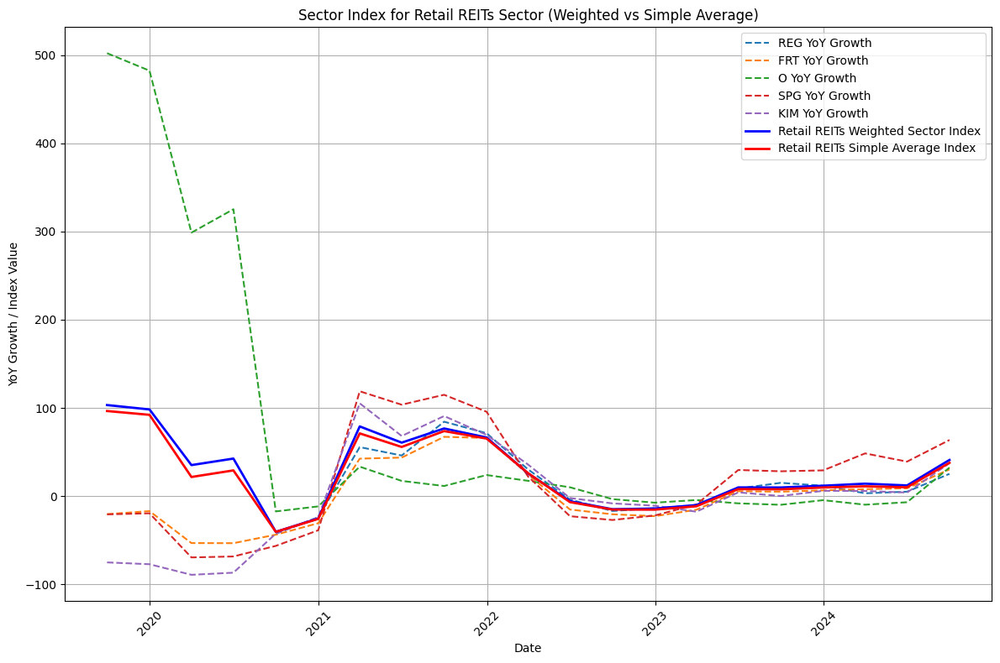

Processing Automotive Retail sector...
Leader for Automotive Retail sector: AZO
Descending order of companies by overperformance in Automotive Retail sector:
AZO: 14 times overperformed
ORLY: 11 times overperformed
KMX: 6 times overperformed
Saved sector index for Automotive Retail to sector_wise_index/Automotive Retail_sector_index.csv


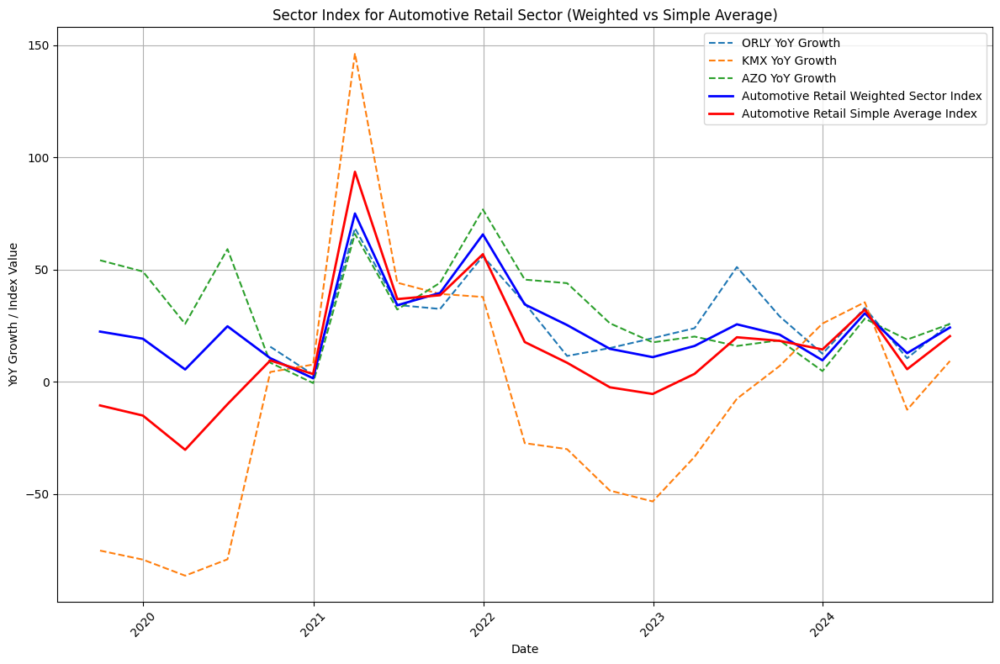

Processing Oil & Gas Equipment & Services sector...
Leader for Oil & Gas Equipment & Services sector: SLB
Descending order of companies by overperformance in Oil & Gas Equipment & Services sector:
SLB: 11 times overperformed
BKR: 9 times overperformed
HAL: 9 times overperformed
Saved sector index for Oil & Gas Equipment & Services to sector_wise_index/Oil & Gas Equipment & Services_sector_index.csv


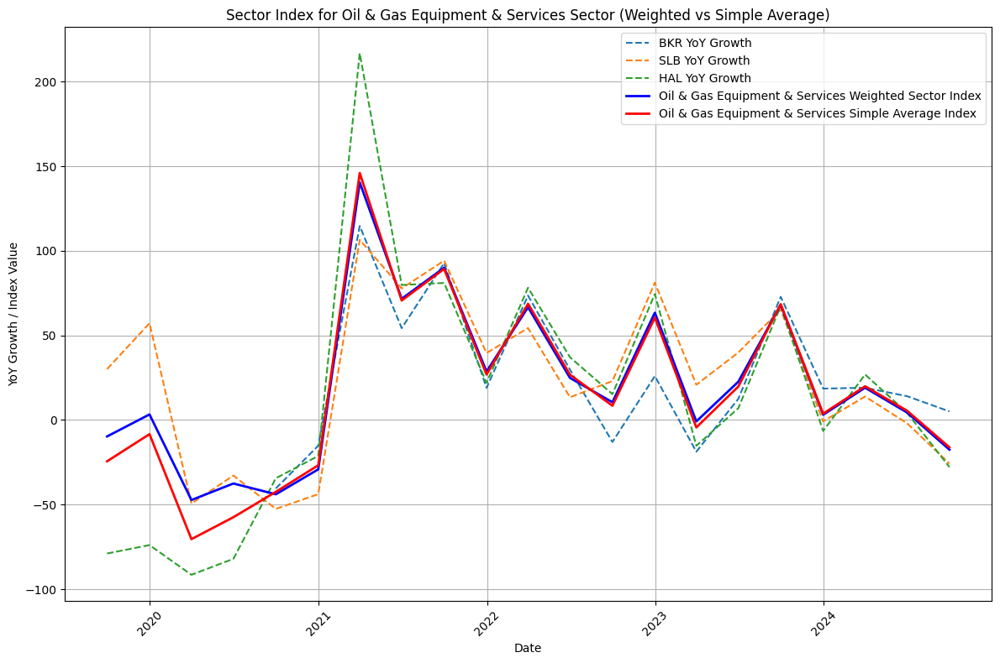

Processing Air Freight & Logistics sector...
Leader for Air Freight & Logistics sector: EXPD
Descending order of companies by overperformance in Air Freight & Logistics sector:
EXPD: 13 times overperformed
UPS: 10 times overperformed
FDX: 10 times overperformed
CHRW: 5 times overperformed
Saved sector index for Air Freight & Logistics to sector_wise_index/Air Freight & Logistics_sector_index.csv


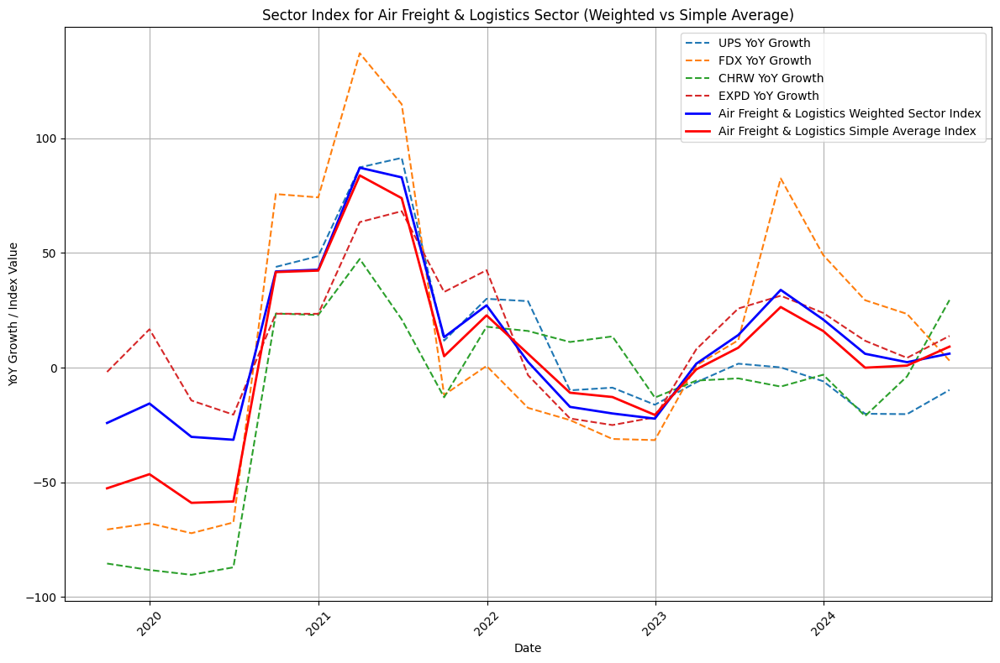

Processing Hotels, Resorts & Cruise Lines sector...
Leader for Hotels, Resorts & Cruise Lines sector: BKNG
Descending order of companies by overperformance in Hotels, Resorts & Cruise Lines sector:
BKNG: 13 times overperformed
RCL: 13 times overperformed
HLT: 10 times overperformed
MAR: 10 times overperformed
CCL: 9 times overperformed
EXPE: 8 times overperformed
NCLH: 4 times overperformed
ABNB: 2 times overperformed
Saved sector index for Hotels, Resorts & Cruise Lines to sector_wise_index/Hotels, Resorts & Cruise Lines_sector_index.csv


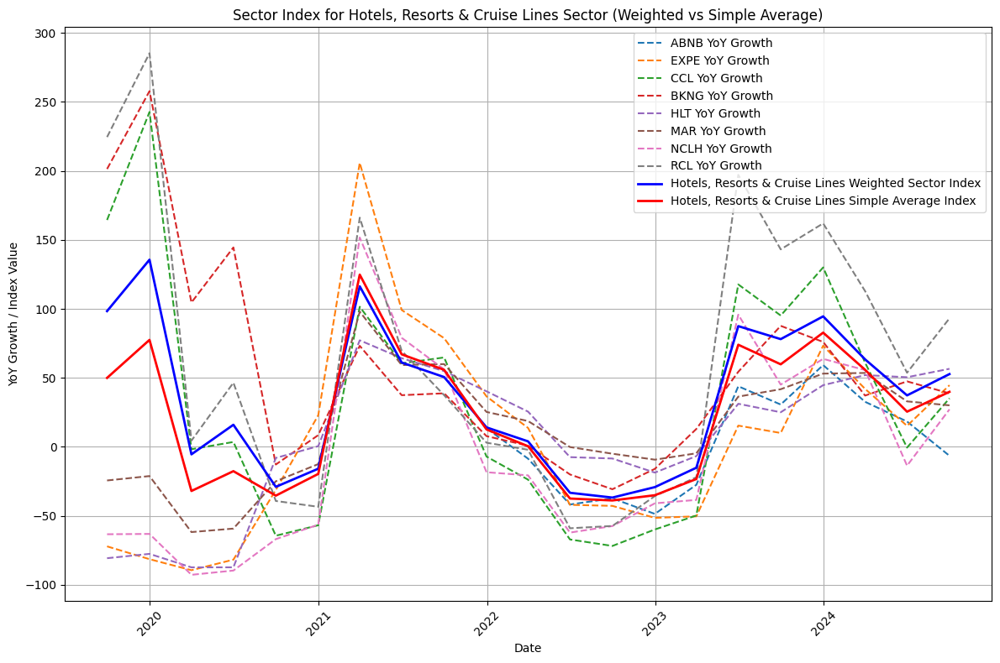

Processing Oil & Gas Exploration & Production sector...
Leader for Oil & Gas Exploration & Production sector: COP
Descending order of companies by overperformance in Oil & Gas Exploration & Production sector:
COP: 12 times overperformed
MRO: 12 times overperformed
FANG: 11 times overperformed
OXY: 10 times overperformed
DVN: 7 times overperformed
EQT: 7 times overperformed
EOG: 5 times overperformed
APA: 4 times overperformed
CTRA: 3 times overperformed
Saved sector index for Oil & Gas Exploration & Production to sector_wise_index/Oil & Gas Exploration & Production_sector_index.csv


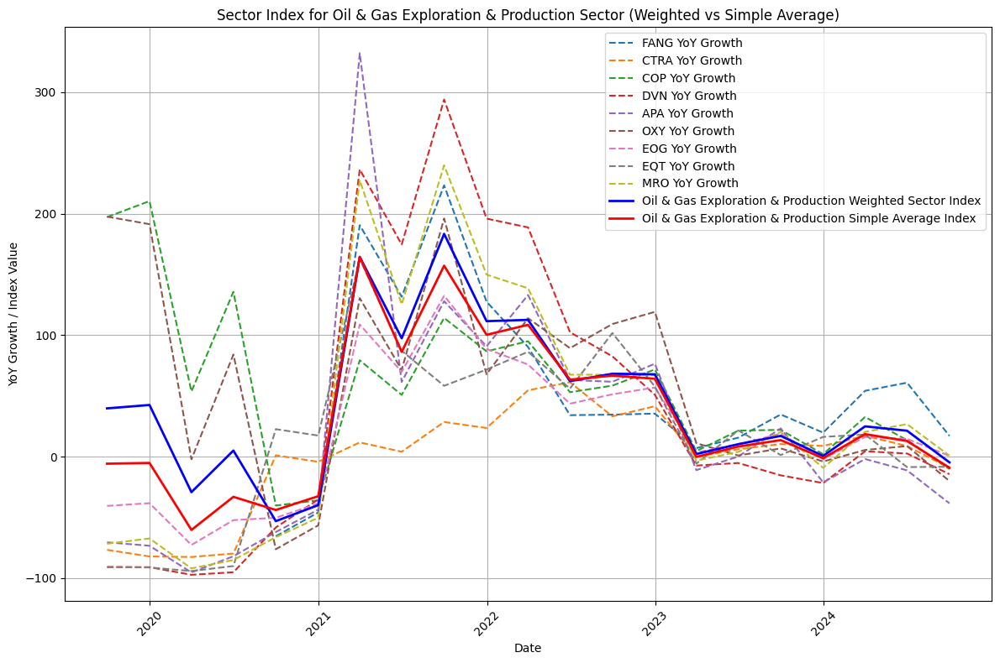

Processing Distributors sector...
Leader for Distributors sector: POOL
Descending order of companies by overperformance in Distributors sector:
POOL: 10 times overperformed
GPC: 10 times overperformed
LKQ: 9 times overperformed
Saved sector index for Distributors to sector_wise_index/Distributors_sector_index.csv


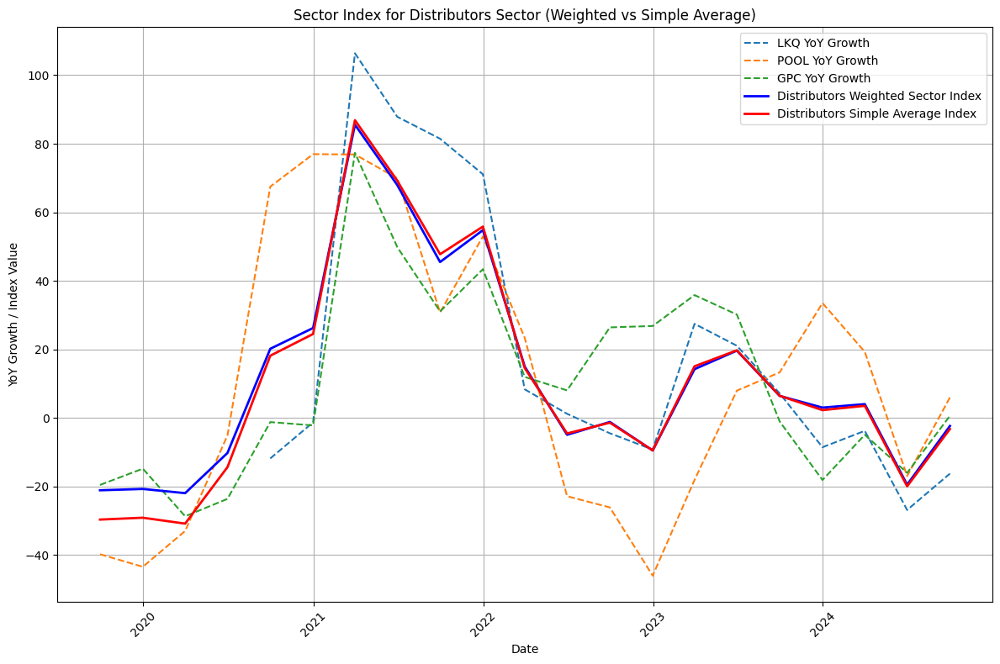

Processing Investment Banking & Brokerage sector...
Leader for Investment Banking & Brokerage sector: MS
Descending order of companies by overperformance in Investment Banking & Brokerage sector:
MS: 12 times overperformed
GS: 9 times overperformed
RJF: 9 times overperformed
SCHW: 8 times overperformed
Saved sector index for Investment Banking & Brokerage to sector_wise_index/Investment Banking & Brokerage_sector_index.csv


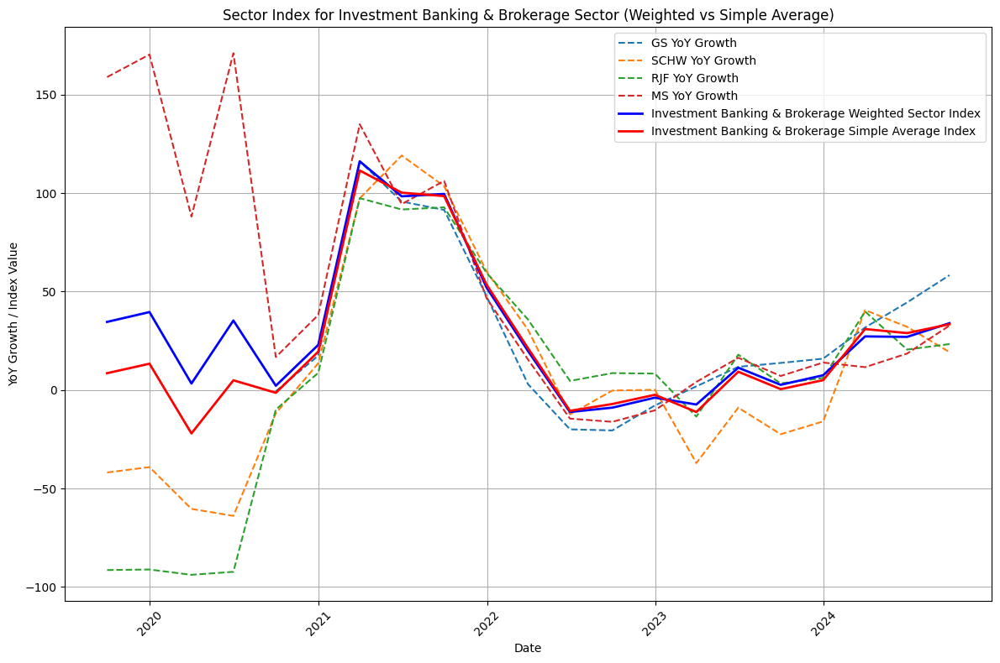

Processing Integrated Oil & Gas sector...
Leader for Integrated Oil & Gas sector: XOM
Descending order of companies by overperformance in Integrated Oil & Gas sector:
XOM: 16 times overperformed
HES: 12 times overperformed
CVX: 4 times overperformed
Saved sector index for Integrated Oil & Gas to sector_wise_index/Integrated Oil & Gas_sector_index.csv


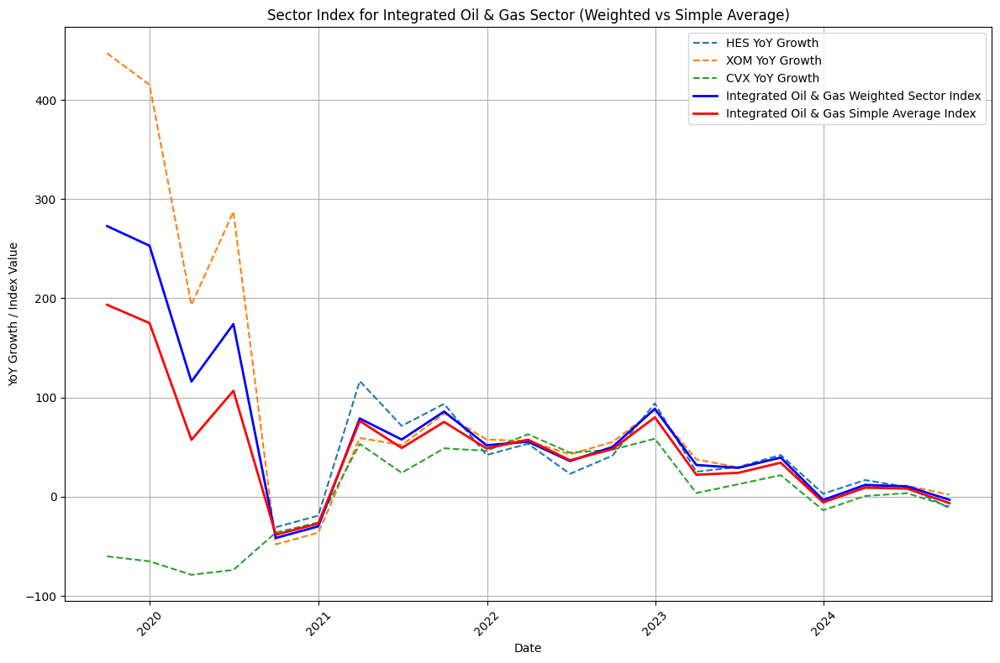

Processing Packaged Foods & Meats sector...
Leader for Packaged Foods & Meats sector: MDLZ
Descending order of companies by overperformance in Packaged Foods & Meats sector:
MDLZ: 15 times overperformed
GIS: 13 times overperformed
HSY: 13 times overperformed
TSN: 13 times overperformed
KHC: 10 times overperformed
SJM: 10 times overperformed
LW: 9 times overperformed
HRL: 8 times overperformed
MKC: 8 times overperformed
CPB: 7 times overperformed
CAG: 6 times overperformed
K: 6 times overperformed
Saved sector index for Packaged Foods & Meats to sector_wise_index/Packaged Foods & Meats_sector_index.csv


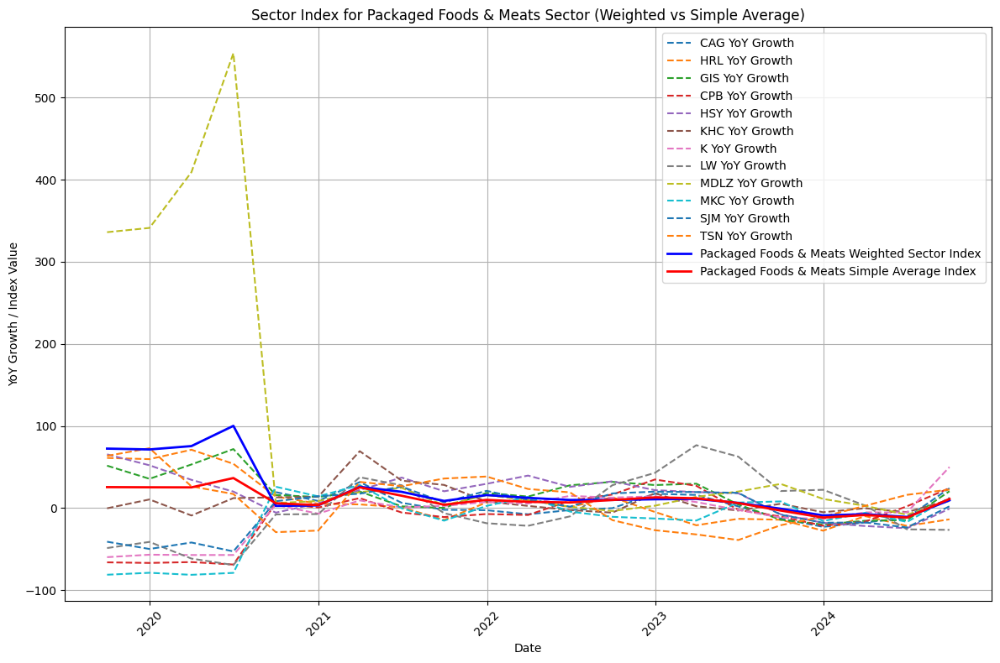

Processing Diversified Banks sector...
Leader for Diversified Banks sector: WFC
Descending order of companies by overperformance in Diversified Banks sector:
WFC: 17 times overperformed
JPM: 14 times overperformed
PNC: 11 times overperformed
BAC: 8 times overperformed
C: 8 times overperformed
TFC: 6 times overperformed
USB: 1 times overperformed
Saved sector index for Diversified Banks to sector_wise_index/Diversified Banks_sector_index.csv


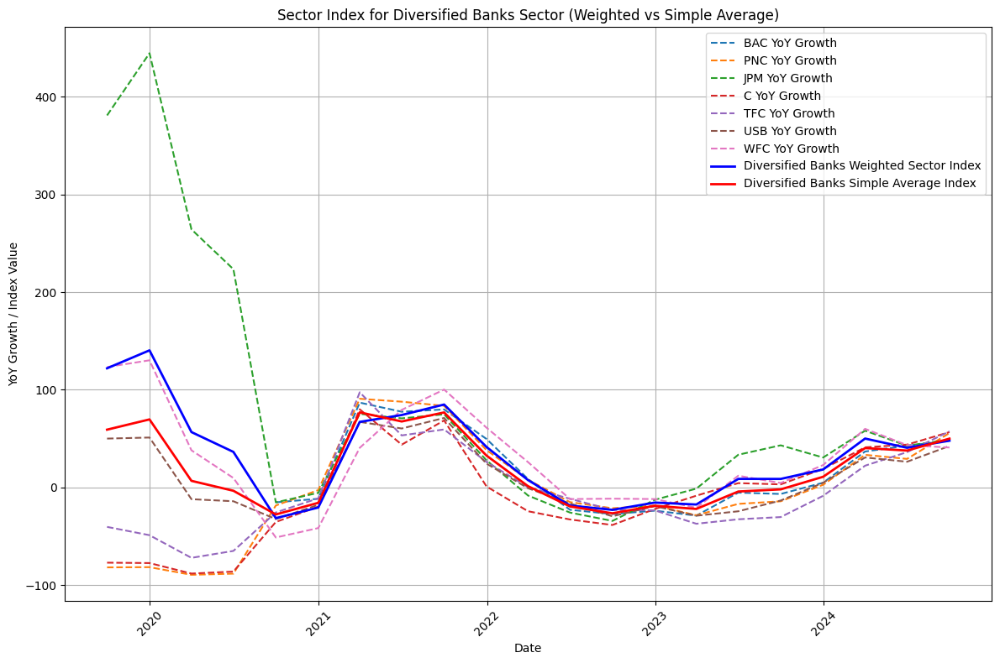

Processing Aerospace & Defense sector...
Leader for Aerospace & Defense sector: AXON
Descending order of companies by overperformance in Aerospace & Defense sector:
AXON: 13 times overperformed
HWM: 12 times overperformed
GE: 11 times overperformed
TDG: 11 times overperformed
LHX: 9 times overperformed
TXT: 9 times overperformed
GD: 8 times overperformed
BA: 8 times overperformed
LMT: 8 times overperformed
RTX: 7 times overperformed
NOC: 6 times overperformed
HII: 4 times overperformed
Saved sector index for Aerospace & Defense to sector_wise_index/Aerospace & Defense_sector_index.csv


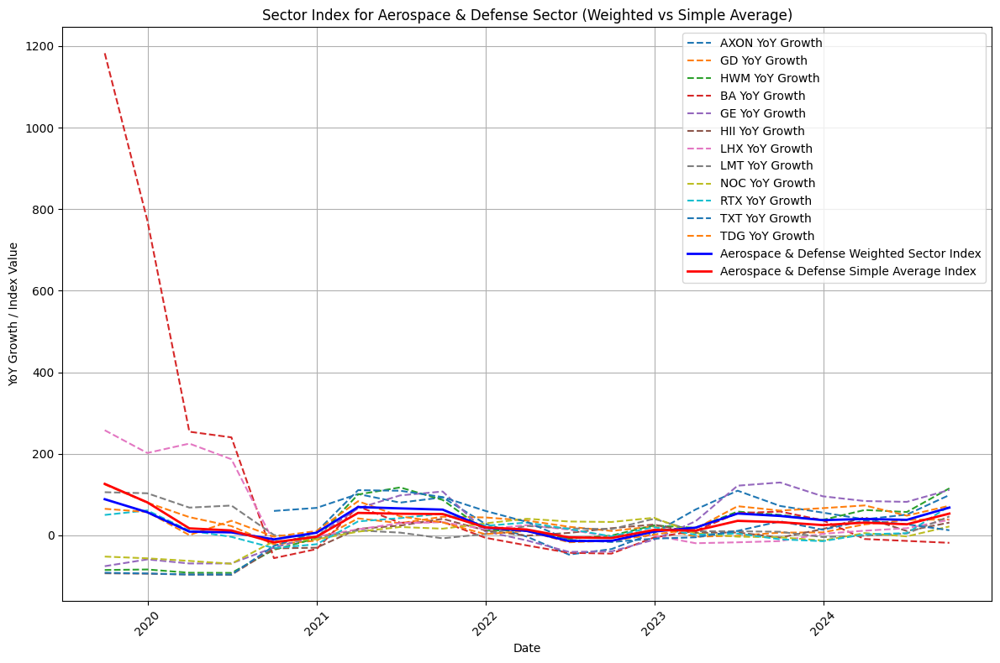

Processing Semiconductor Materials & Equipment sector...
Leader for Semiconductor Materials & Equipment sector: KLAC
Descending order of companies by overperformance in Semiconductor Materials & Equipment sector:
KLAC: 15 times overperformed
ENPH: 10 times overperformed
AMAT: 9 times overperformed
LRCX: 8 times overperformed
TER: 3 times overperformed
Saved sector index for Semiconductor Materials & Equipment to sector_wise_index/Semiconductor Materials & Equipment_sector_index.csv


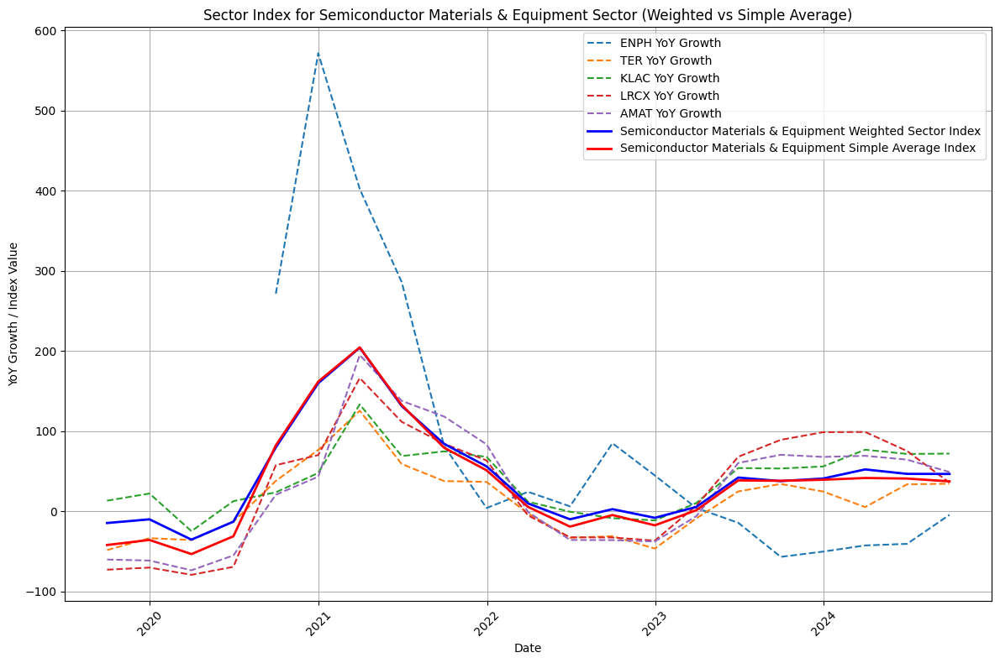

Processing Casinos & Gaming sector...
Leader for Casinos & Gaming sector: MGM
Descending order of companies by overperformance in Casinos & Gaming sector:
MGM: 11 times overperformed
LVS: 10 times overperformed
CZR: 8 times overperformed
WYNN: 7 times overperformed
Saved sector index for Casinos & Gaming to sector_wise_index/Casinos & Gaming_sector_index.csv


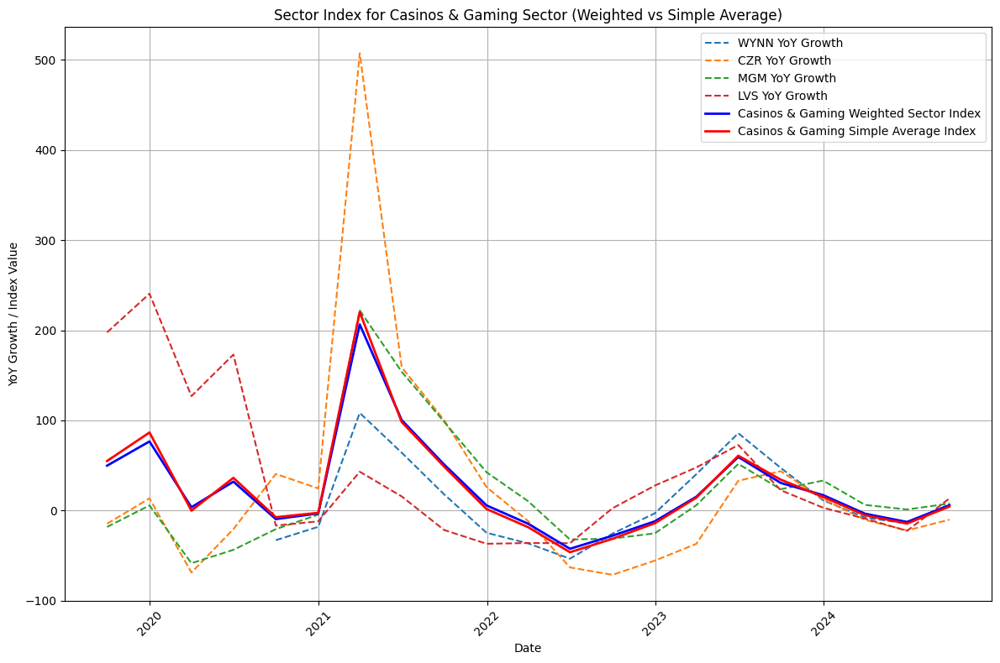

Processing Communications Equipment sector...
Leader for Communications Equipment sector: ANET
Descending order of companies by overperformance in Communications Equipment sector:
ANET: 19 times overperformed
MSI: 9 times overperformed
JNPR: 6 times overperformed
CSCO: 5 times overperformed
FFIV: 4 times overperformed
Saved sector index for Communications Equipment to sector_wise_index/Communications Equipment_sector_index.csv


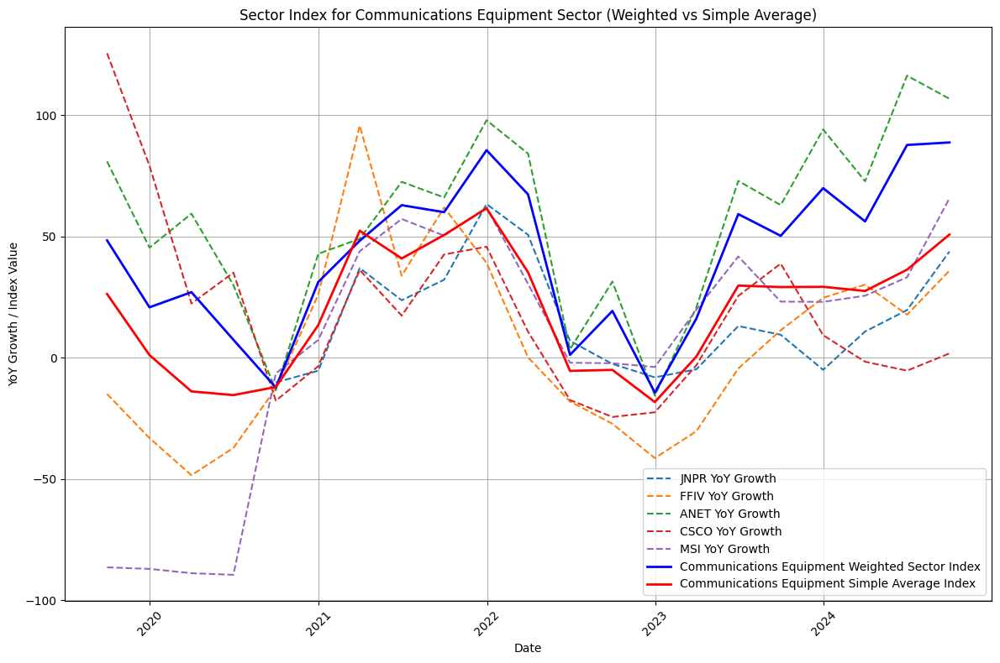

Processing Health Care Distributors sector...
Leader for Health Care Distributors sector: MCK
Descending order of companies by overperformance in Health Care Distributors sector:
MCK: 19 times overperformed
COR: 11 times overperformed
CAH: 8 times overperformed
HSIC: 2 times overperformed
Saved sector index for Health Care Distributors to sector_wise_index/Health Care Distributors_sector_index.csv


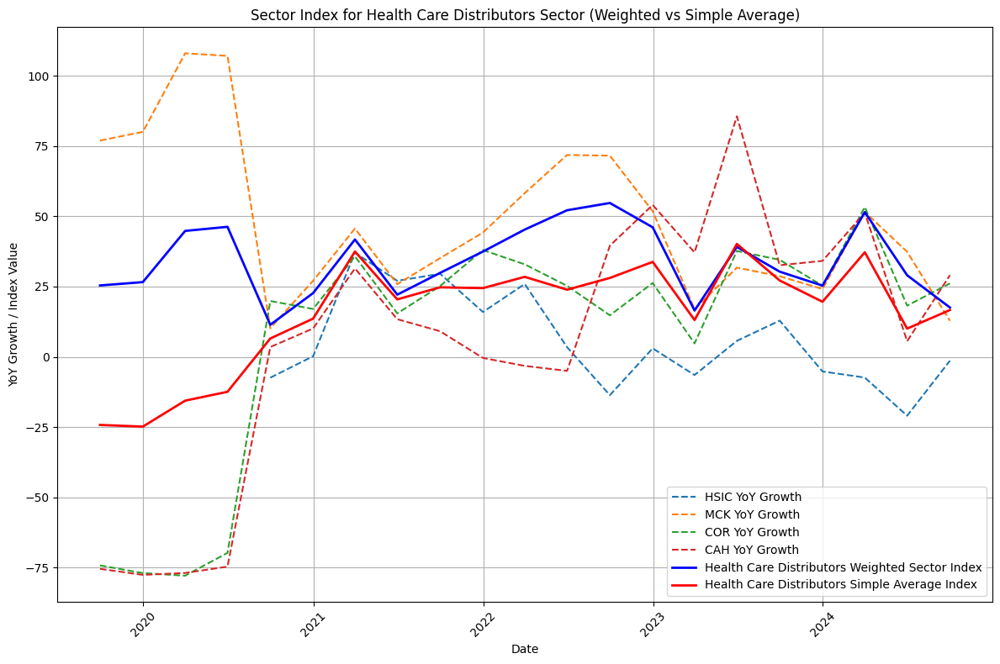

Processing Movies & Entertainment sector...
Leader for Movies & Entertainment sector: LYV
Descending order of companies by overperformance in Movies & Entertainment sector:
LYV: 11 times overperformed
NFLX: 10 times overperformed
DIS: 8 times overperformed
PARA: 4 times overperformed
Saved sector index for Movies & Entertainment to sector_wise_index/Movies & Entertainment_sector_index.csv


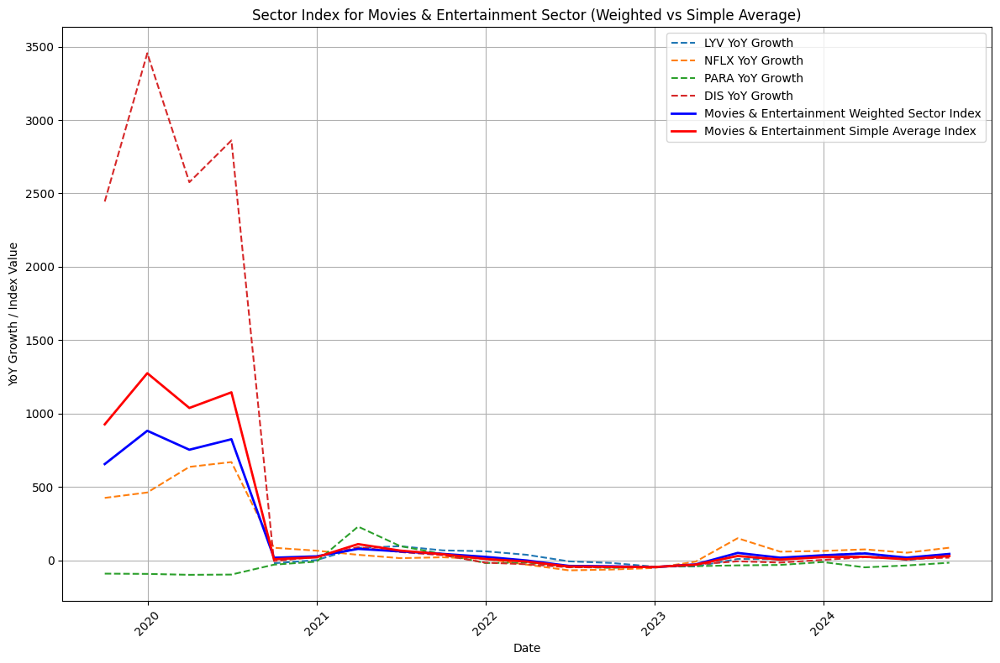

Processing Interactive Media & Services sector...
Leader for Interactive Media & Services sector: GOOGL
Descending order of companies by overperformance in Interactive Media & Services sector:
GOOGL: 13 times overperformed
GOOG: 9 times overperformed
META: 8 times overperformed
MTCH: 3 times overperformed
Saved sector index for Interactive Media & Services to sector_wise_index/Interactive Media & Services_sector_index.csv


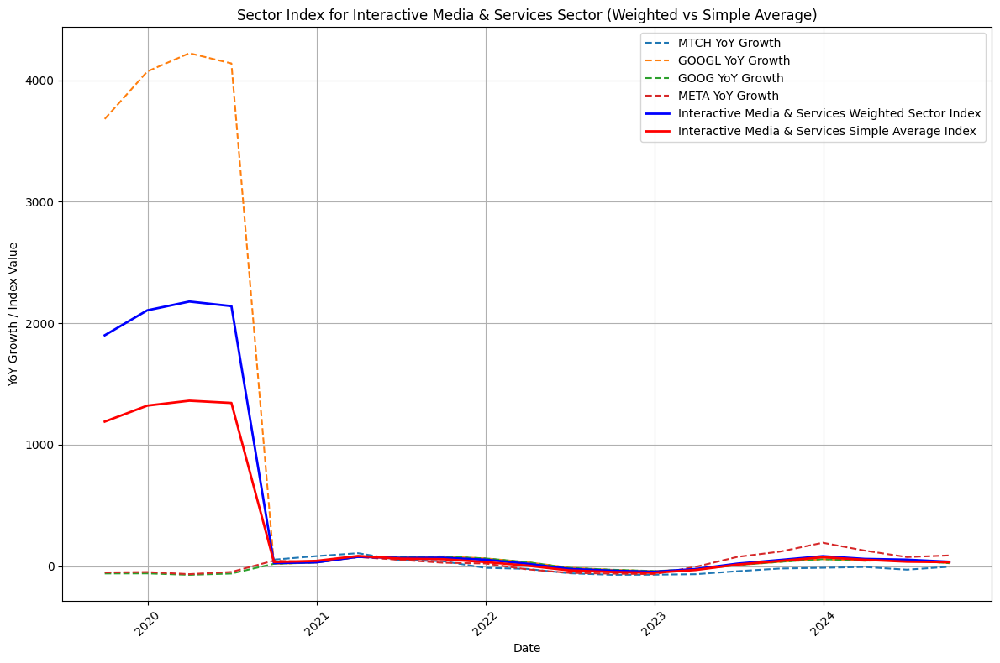

Processing Specialty Chemicals sector...
Leader for Specialty Chemicals sector: SHW
Descending order of companies by overperformance in Specialty Chemicals sector:
SHW: 13 times overperformed
LYB: 12 times overperformed
ECL: 11 times overperformed
ALB: 11 times overperformed
DD: 10 times overperformed
CE: 8 times overperformed
EMN: 8 times overperformed
PPG: 7 times overperformed
IFF: 3 times overperformed
Saved sector index for Specialty Chemicals to sector_wise_index/Specialty Chemicals_sector_index.csv


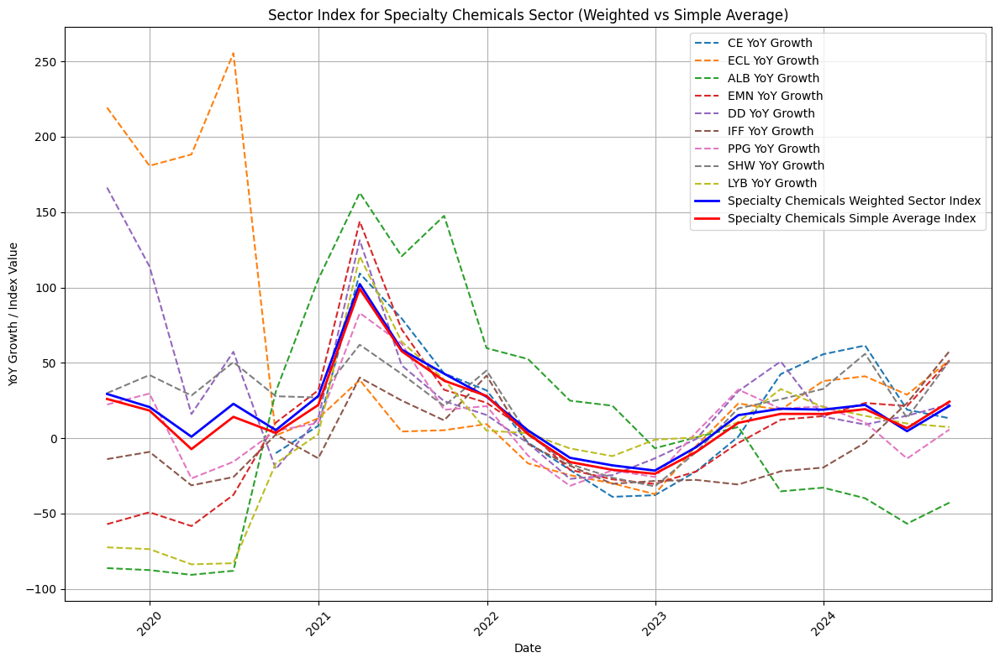

Processing Building Products sector...
Leader for Building Products sector: BLDR
Descending order of companies by overperformance in Building Products sector:
BLDR: 15 times overperformed
TT: 15 times overperformed
JCI: 10 times overperformed
MAS: 8 times overperformed
CARR: 7 times overperformed
AOS: 2 times overperformed
ALLE: 1 times overperformed
Saved sector index for Building Products to sector_wise_index/Building Products_sector_index.csv


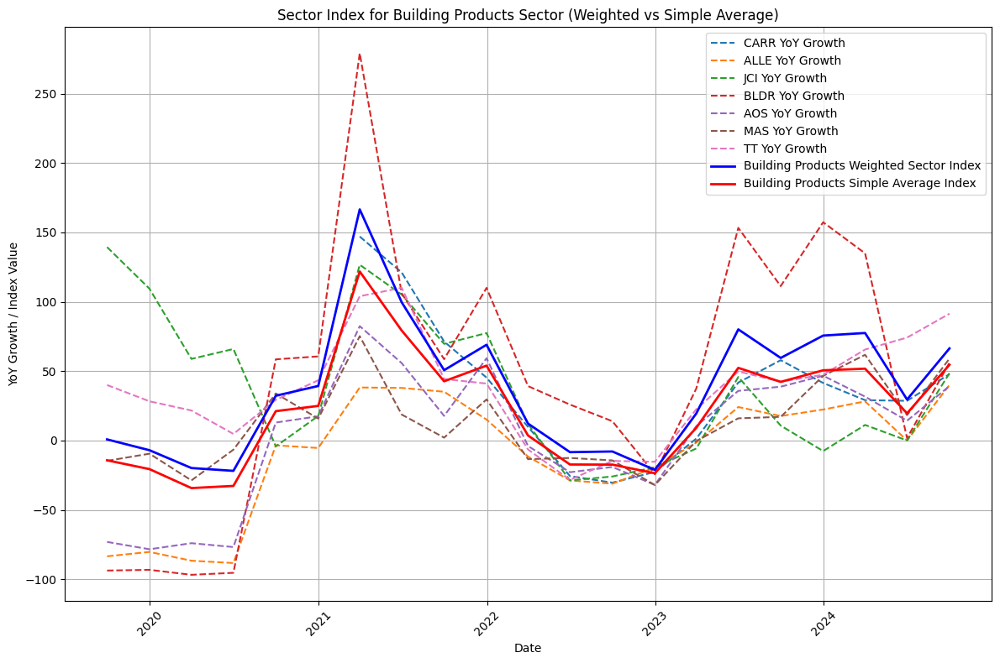

Processing Asset Management & Custody Banks sector...
Leader for Asset Management & Custody Banks sector: AMP
Descending order of companies by overperformance in Asset Management & Custody Banks sector:
AMP: 19 times overperformed
KKR: 15 times overperformed
BX: 13 times overperformed
STT: 9 times overperformed
BLK: 8 times overperformed
BK: 8 times overperformed
TROW: 6 times overperformed
BEN: 5 times overperformed
IVZ: 4 times overperformed
NTRS: 2 times overperformed
Saved sector index for Asset Management & Custody Banks to sector_wise_index/Asset Management & Custody Banks_sector_index.csv


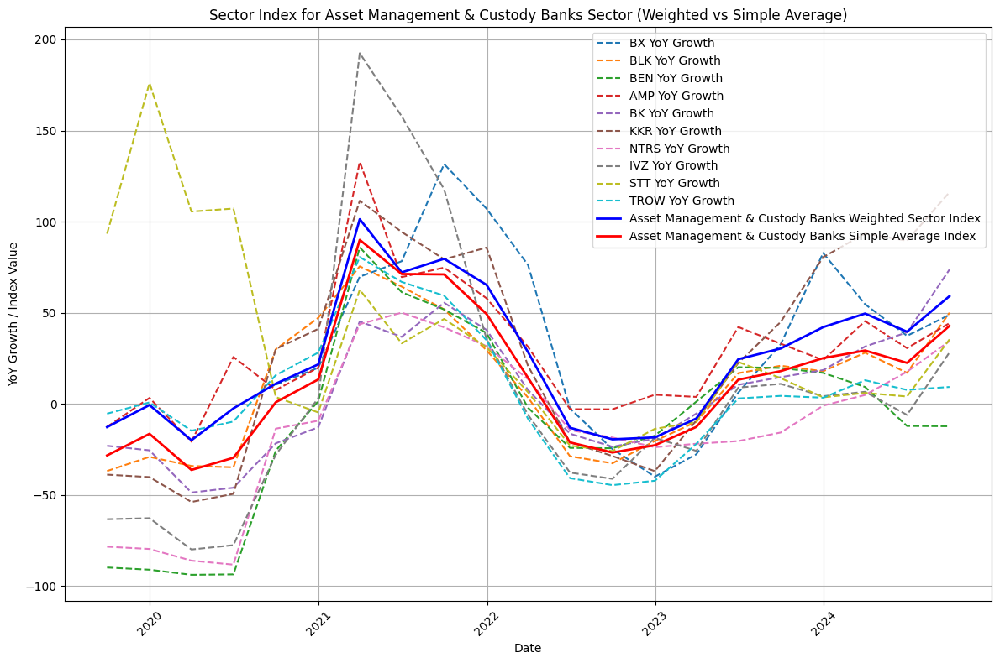

Processing Consumer Staples Merchandise Retail sector...
Leader for Consumer Staples Merchandise Retail sector: COST
Descending order of companies by overperformance in Consumer Staples Merchandise Retail sector:
COST: 16 times overperformed
WMT: 12 times overperformed
TGT: 8 times overperformed
DG: 6 times overperformed
DLTR: 6 times overperformed
Saved sector index for Consumer Staples Merchandise Retail to sector_wise_index/Consumer Staples Merchandise Retail_sector_index.csv


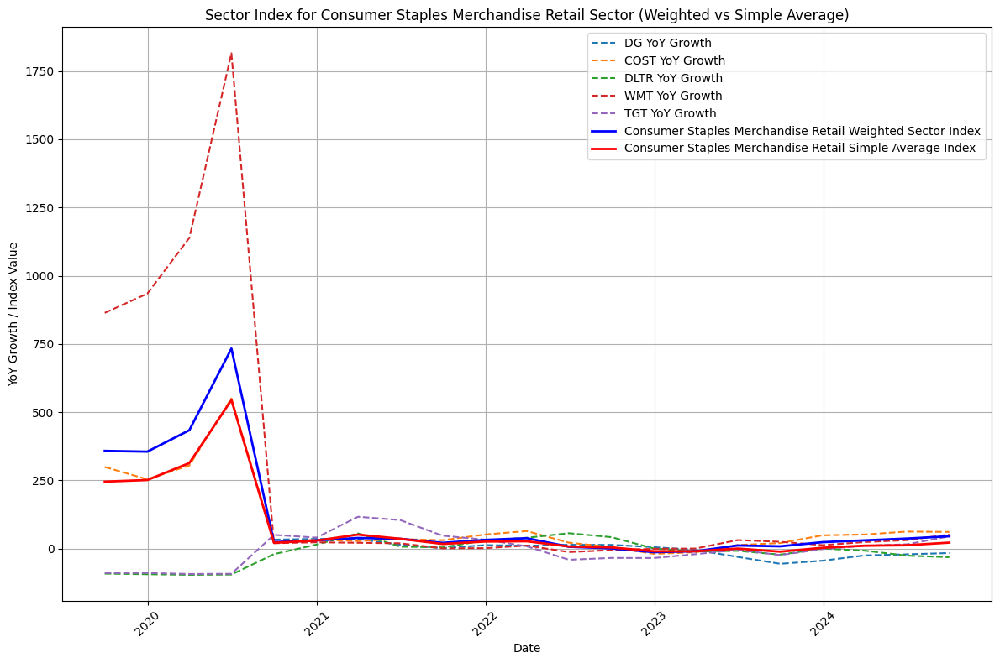

Processing Systems Software sector...
Leader for Systems Software sector: PANW
Descending order of companies by overperformance in Systems Software sector:
PANW: 11 times overperformed
MSFT: 10 times overperformed
CRWD: 9 times overperformed
FTNT: 8 times overperformed
NOW: 6 times overperformed
GEN: 3 times overperformed
Saved sector index for Systems Software to sector_wise_index/Systems Software_sector_index.csv


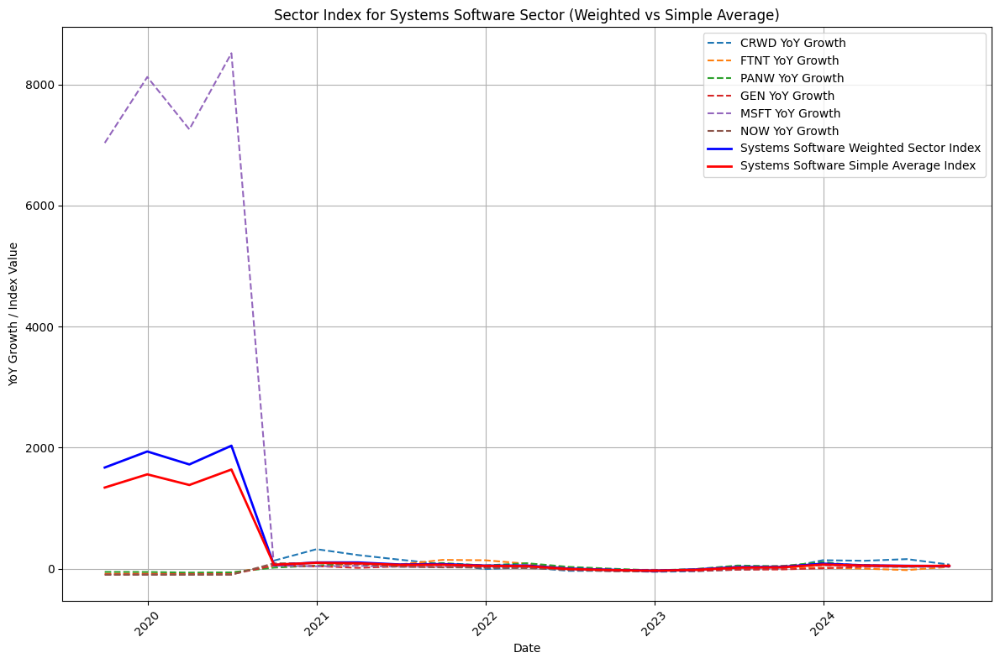

Processing Electrical Components & Equipment sector...
Leader for Electrical Components & Equipment sector: ETN
Descending order of companies by overperformance in Electrical Components & Equipment sector:
ETN: 12 times overperformed
ROK: 9 times overperformed
GNRC: 8 times overperformed
EMR: 7 times overperformed
AME: 6 times overperformed
Saved sector index for Electrical Components & Equipment to sector_wise_index/Electrical Components & Equipment_sector_index.csv


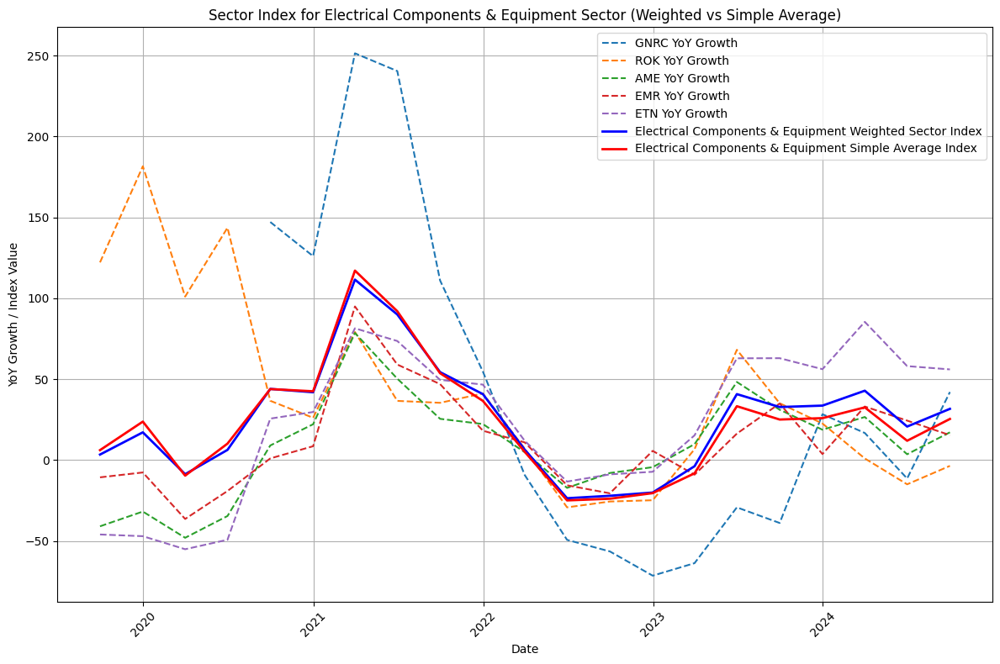

Processing Industrial Machinery & Supplies & Components sector...
Leader for Industrial Machinery & Supplies & Components sector: GWW
Descending order of companies by overperformance in Industrial Machinery & Supplies & Components sector:
GWW: 18 times overperformed
IR: 15 times overperformed
PH: 14 times overperformed
HUBB: 13 times overperformed
PNR: 12 times overperformed
XYL: 12 times overperformed
ITW: 10 times overperformed
SNA: 10 times overperformed
DOV: 7 times overperformed
NDSN: 7 times overperformed
IEX: 6 times overperformed
FTV: 5 times overperformed
OTIS: 5 times overperformed
SWK: 4 times overperformed
Saved sector index for Industrial Machinery & Supplies & Components to sector_wise_index/Industrial Machinery & Supplies & Components_sector_index.csv


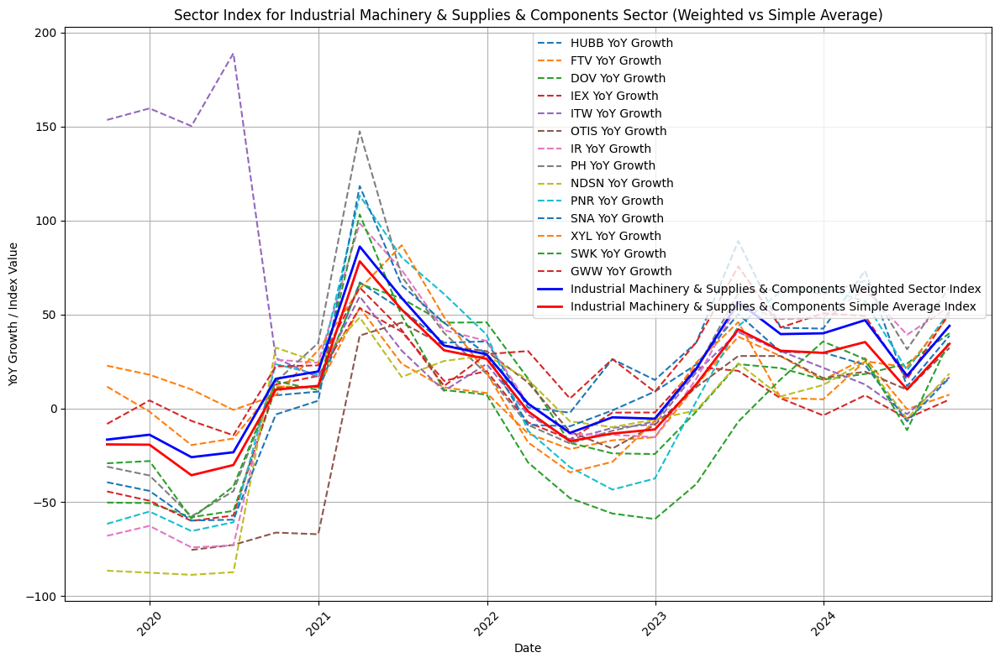

Processing Construction Machinery & Heavy Transportation Equipment sector...
Leader for Construction Machinery & Heavy Transportation Equipment sector: CAT
Descending order of companies by overperformance in Construction Machinery & Heavy Transportation Equipment sector:
CAT: 14 times overperformed
PCAR: 13 times overperformed
WAB: 7 times overperformed
CMI: 5 times overperformed
Saved sector index for Construction Machinery & Heavy Transportation Equipment to sector_wise_index/Construction Machinery & Heavy Transportation Equipment_sector_index.csv


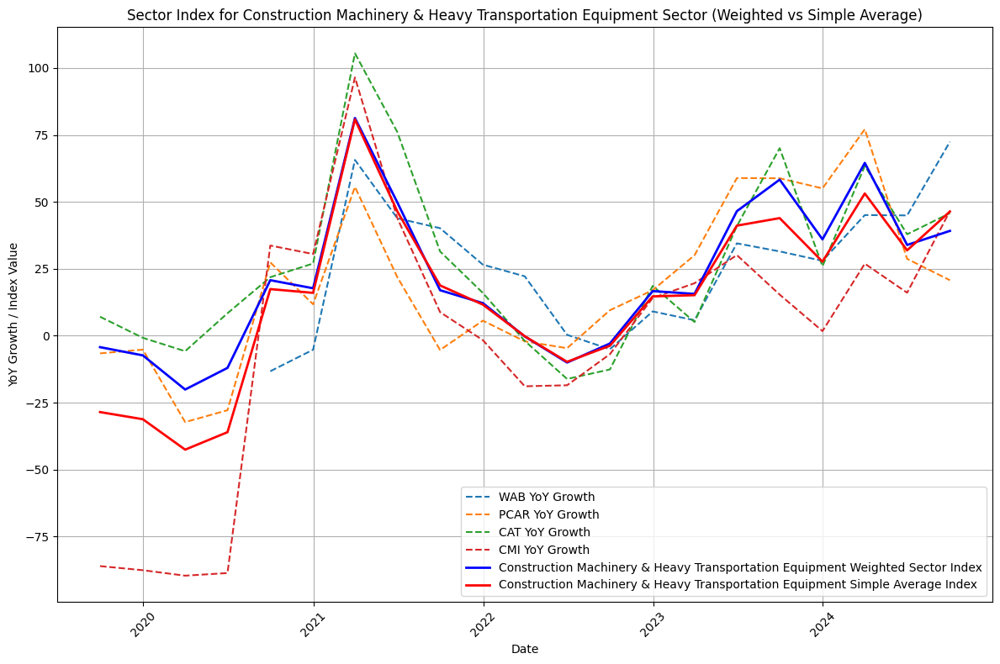

Processing Biotechnology sector...
Leader for Biotechnology sector: REGN
Descending order of companies by overperformance in Biotechnology sector:
REGN: 13 times overperformed
VRTX: 13 times overperformed
AMGN: 12 times overperformed
ABBV: 10 times overperformed
BIIB: 7 times overperformed
MRNA: 7 times overperformed
GILD: 6 times overperformed
INCY: 1 times overperformed
Saved sector index for Biotechnology to sector_wise_index/Biotechnology_sector_index.csv


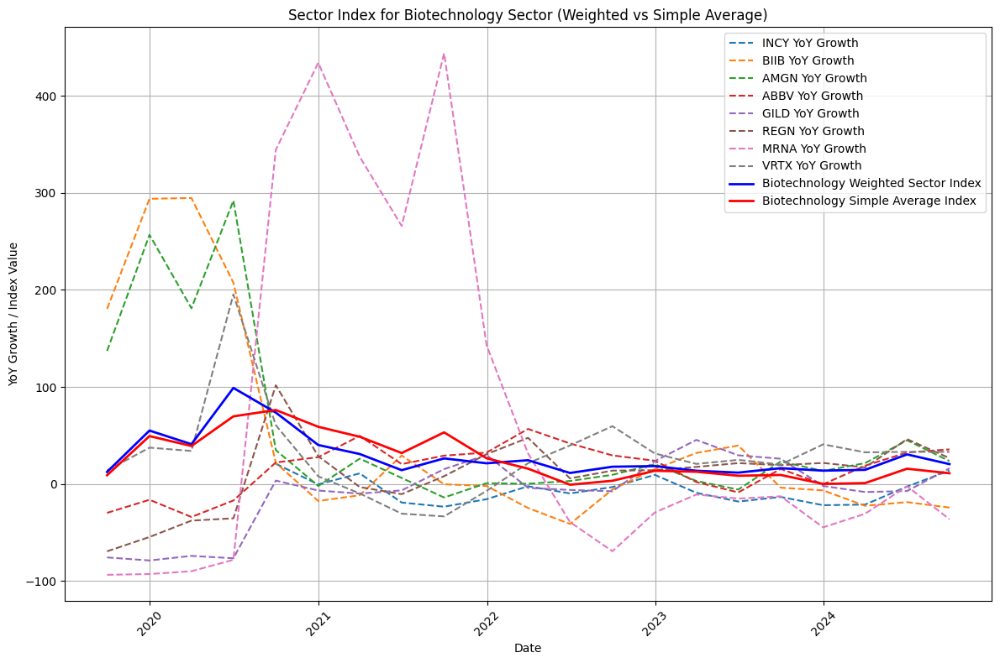

Processing Automobile Manufacturers sector...
Leader for Automobile Manufacturers sector: TSLA
Descending order of companies by overperformance in Automobile Manufacturers sector:
TSLA: 12 times overperformed
F: 8 times overperformed
GM: 5 times overperformed
Saved sector index for Automobile Manufacturers to sector_wise_index/Automobile Manufacturers_sector_index.csv


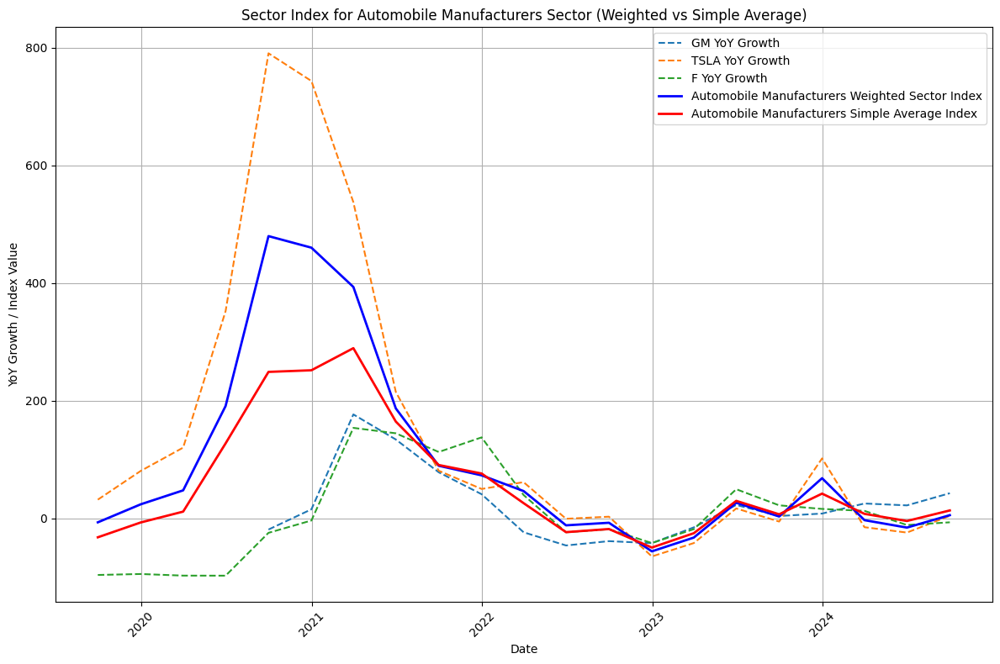

Processing Health Care Supplies sector...
Leader for Health Care Supplies sector: WST
Descending order of companies by overperformance in Health Care Supplies sector:
WST: 12 times overperformed
COO: 10 times overperformed
ALGN: 7 times overperformed
Saved sector index for Health Care Supplies to sector_wise_index/Health Care Supplies_sector_index.csv


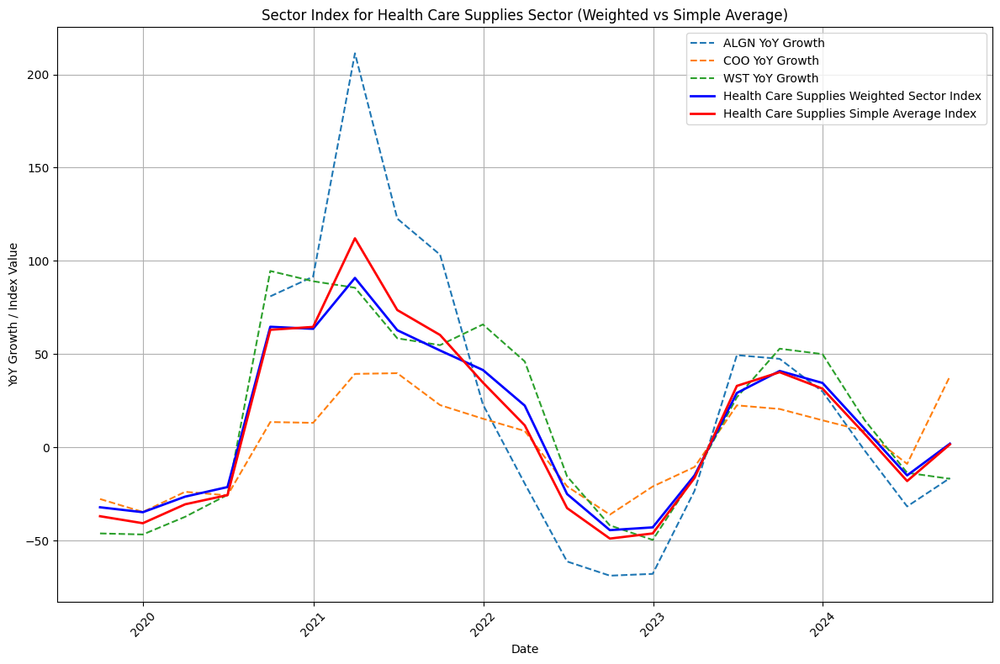

Processing Passenger Airlines sector...
Leader for Passenger Airlines sector: DAL
Descending order of companies by overperformance in Passenger Airlines sector:
DAL: 18 times overperformed
UAL: 11 times overperformed
LUV: 4 times overperformed
Saved sector index for Passenger Airlines to sector_wise_index/Passenger Airlines_sector_index.csv


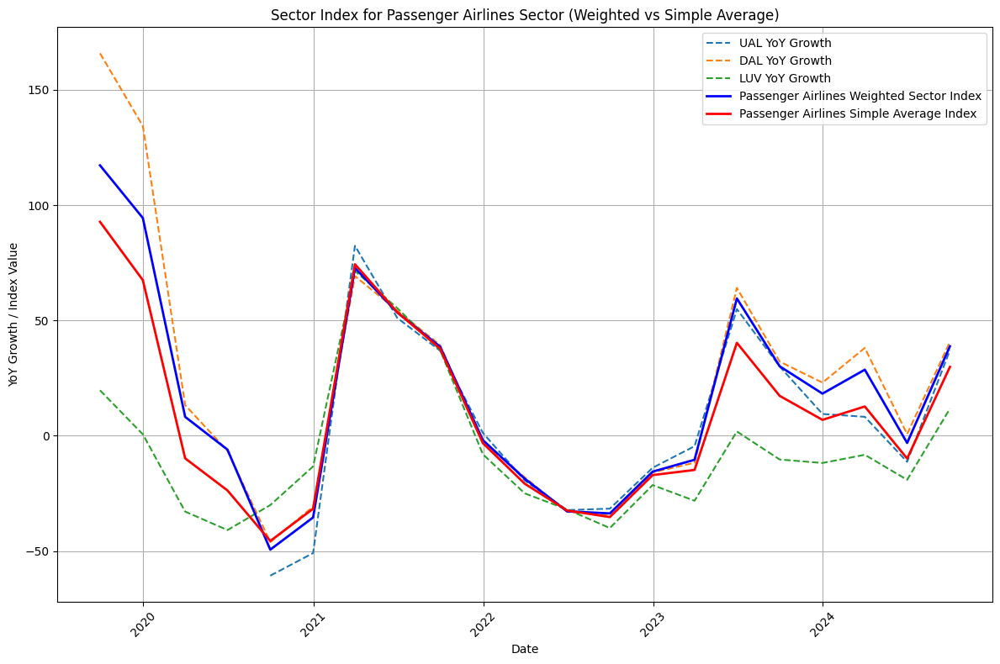

Processing Household Products sector...
Leader for Household Products sector: CHD
Descending order of companies by overperformance in Household Products sector:
CHD: 11 times overperformed
CL: 11 times overperformed
KMB: 10 times overperformed
CLX: 5 times overperformed
Saved sector index for Household Products to sector_wise_index/Household Products_sector_index.csv


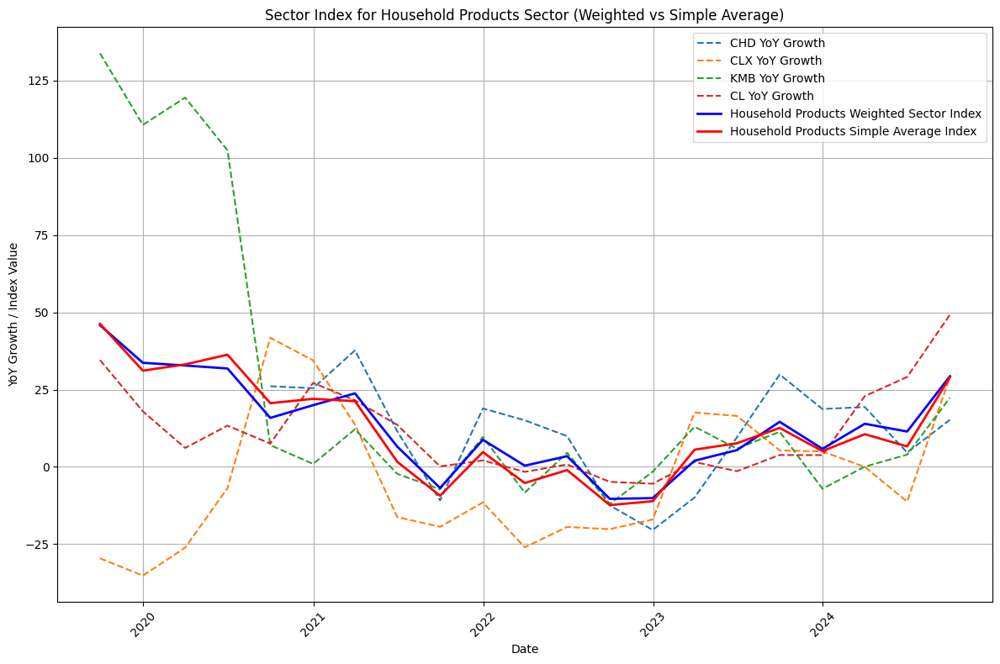

Processing Apparel, Accessories & Luxury Goods sector...
Leader for Apparel, Accessories & Luxury Goods sector: RL
Descending order of companies by overperformance in Apparel, Accessories & Luxury Goods sector:
RL: 11 times overperformed
TPR: 10 times overperformed
LULU: 7 times overperformed
NKE: 7 times overperformed
Saved sector index for Apparel, Accessories & Luxury Goods to sector_wise_index/Apparel, Accessories & Luxury Goods_sector_index.csv


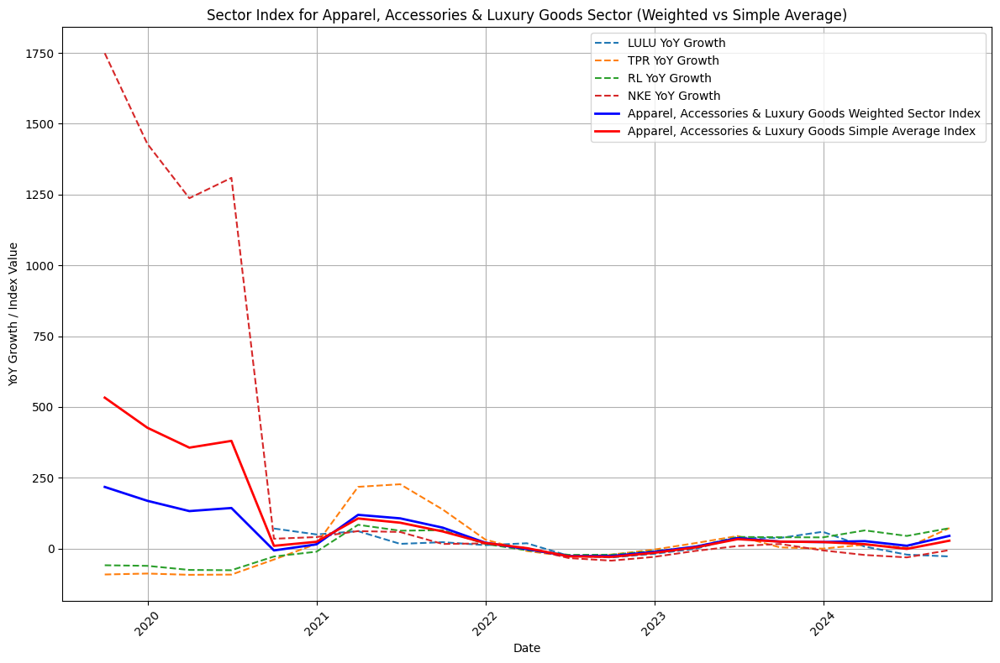

Processing Application Software sector...
Leader for Application Software sector: SNPS
Descending order of companies by overperformance in Application Software sector:
SNPS: 16 times overperformed
CDNS: 15 times overperformed
ORCL: 14 times overperformed
FICO: 10 times overperformed
PTC: 8 times overperformed
ADBE: 7 times overperformed
INTU: 7 times overperformed
ADSK: 4 times overperformed
CRM: 4 times overperformed
TYL: 4 times overperformed
ANSS: 1 times overperformed
Saved sector index for Application Software to sector_wise_index/Application Software_sector_index.csv


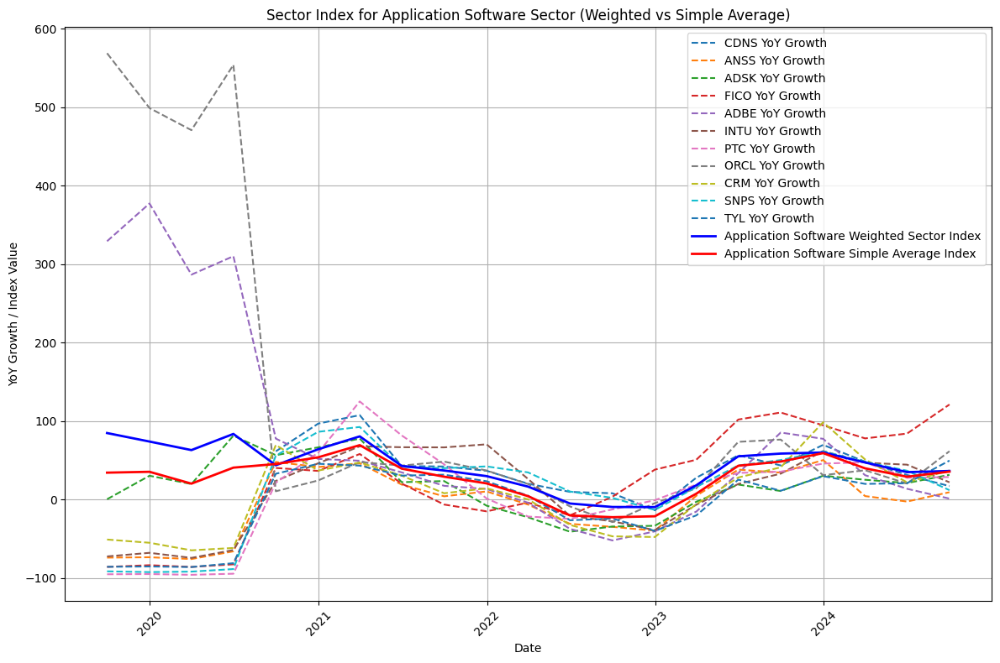

Processing Telecom Tower REITs sector...
Leader for Telecom Tower REITs sector: AMT
Descending order of companies by overperformance in Telecom Tower REITs sector:
AMT: 14 times overperformed
SBAC: 7 times overperformed
CCI: 6 times overperformed
Saved sector index for Telecom Tower REITs to sector_wise_index/Telecom Tower REITs_sector_index.csv


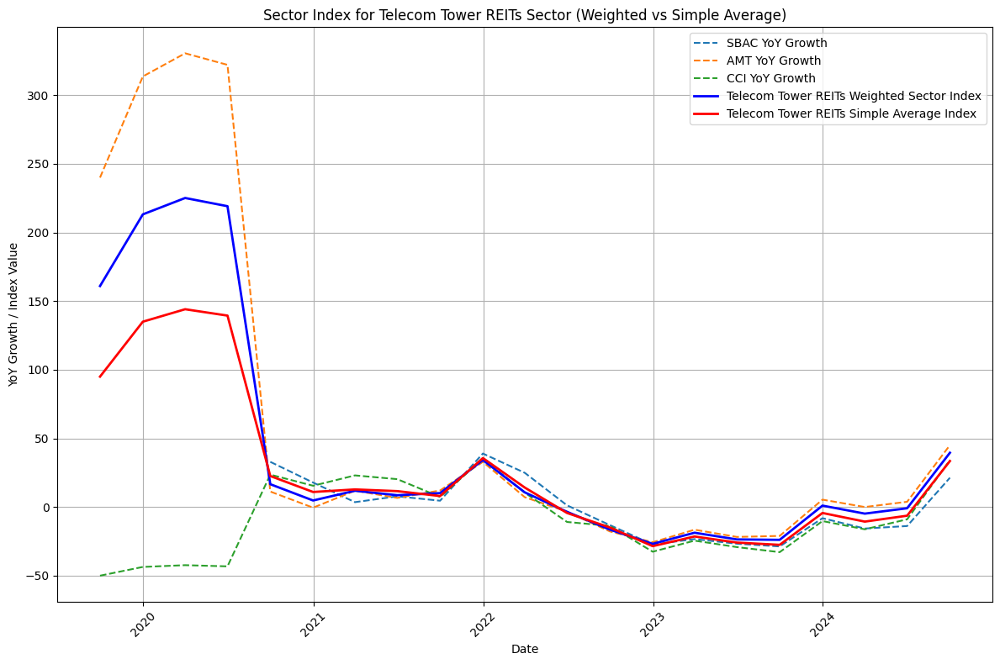

Processing Environmental & Facilities Services sector...
Leader for Environmental & Facilities Services sector: WM
Descending order of companies by overperformance in Environmental & Facilities Services sector:
WM: 11 times overperformed
RSG: 11 times overperformed
ROL: 7 times overperformed
Saved sector index for Environmental & Facilities Services to sector_wise_index/Environmental & Facilities Services_sector_index.csv


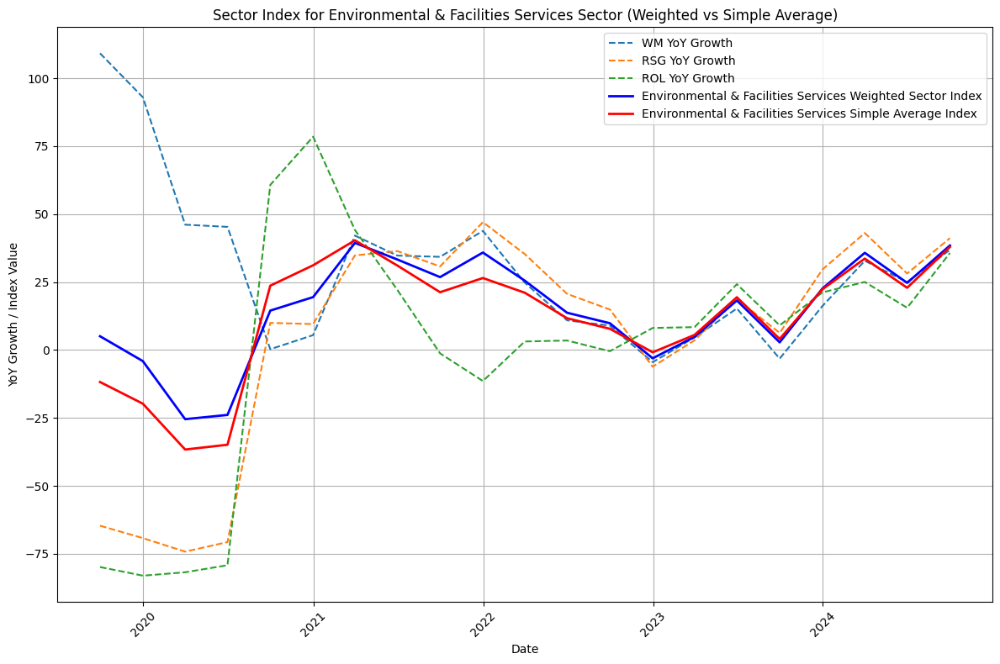

Processing Semiconductors sector...
Leader for Semiconductors sector: NVDA
Descending order of companies by overperformance in Semiconductors sector:
NVDA: 13 times overperformed
AMD: 11 times overperformed
AVGO: 11 times overperformed
ON: 11 times overperformed
QCOM: 11 times overperformed
MPWR: 10 times overperformed
FSLR: 9 times overperformed
MU: 7 times overperformed
MCHP: 6 times overperformed
ADI: 5 times overperformed
INTC: 5 times overperformed
NXPI: 4 times overperformed
QRVO: 3 times overperformed
TXN: 3 times overperformed
SWKS: 2 times overperformed
Saved sector index for Semiconductors to sector_wise_index/Semiconductors_sector_index.csv


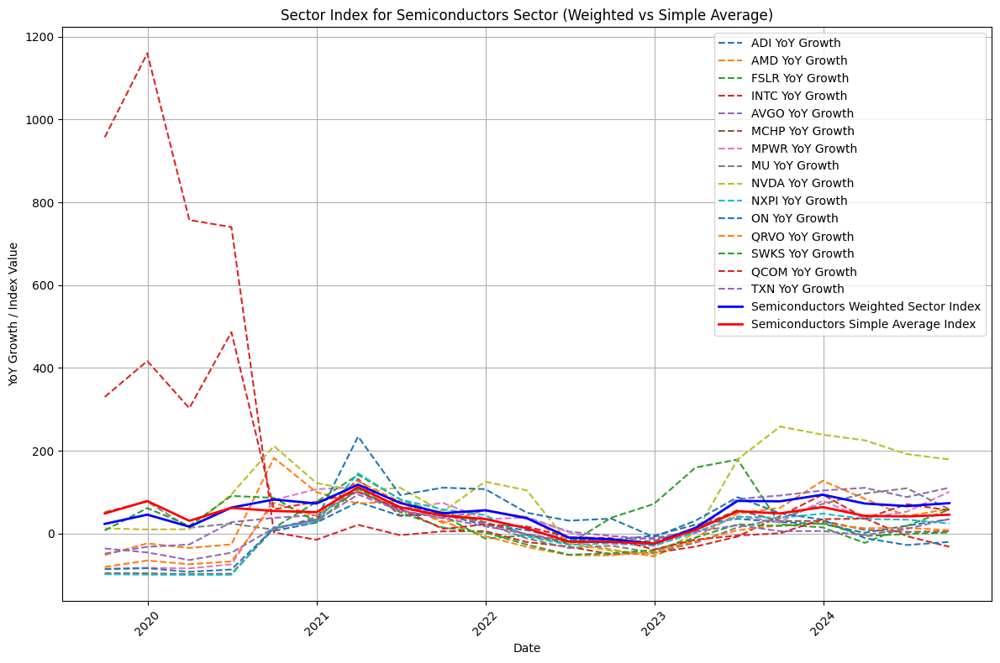

Processing Electric Utilities sector...
Leader for Electric Utilities sector: EXC
Descending order of companies by overperformance in Electric Utilities sector:
EXC: 14 times overperformed
SO: 14 times overperformed
PEG: 13 times overperformed
VST: 11 times overperformed
AEP: 8 times overperformed
ETR: 8 times overperformed
CEG: 7 times overperformed
DUK: 7 times overperformed
EIX: 7 times overperformed
FE: 7 times overperformed
ES: 6 times overperformed
LNT: 4 times overperformed
PPL: 4 times overperformed
WEC: 4 times overperformed
EVRG: 2 times overperformed
Saved sector index for Electric Utilities to sector_wise_index/Electric Utilities_sector_index.csv


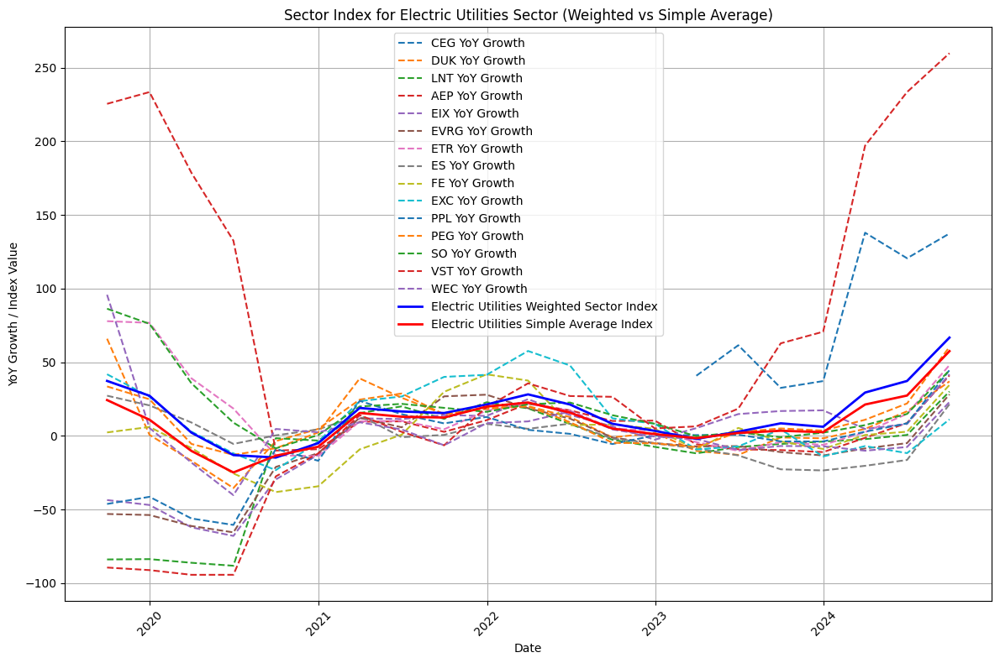

Processing Internet Services & Infrastructure sector...
Leader for Internet Services & Infrastructure sector: GDDY
Descending order of companies by overperformance in Internet Services & Infrastructure sector:
GDDY: 12 times overperformed
PLTR: 11 times overperformed
VRSN: 7 times overperformed
AKAM: 6 times overperformed
Saved sector index for Internet Services & Infrastructure to sector_wise_index/Internet Services & Infrastructure_sector_index.csv


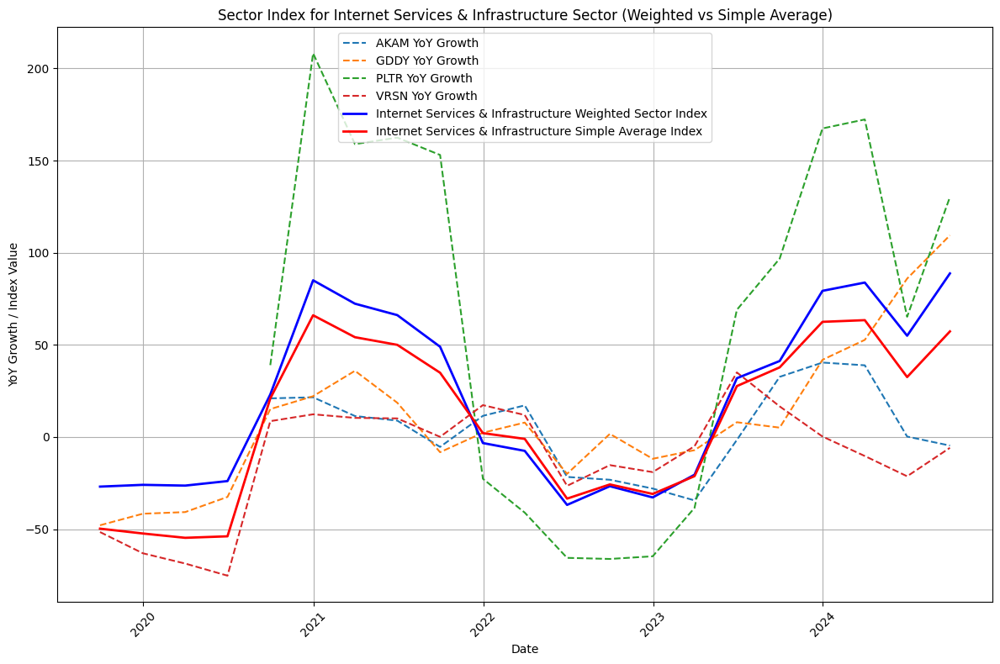

Processing Electronic Equipment & Instruments sector...
Leader for Electronic Equipment & Instruments sector: ROP
Descending order of companies by overperformance in Electronic Equipment & Instruments sector:
ROP: 15 times overperformed
TDY: 10 times overperformed
ZBRA: 8 times overperformed
KEYS: 8 times overperformed
TRMB: 7 times overperformed
Saved sector index for Electronic Equipment & Instruments to sector_wise_index/Electronic Equipment & Instruments_sector_index.csv


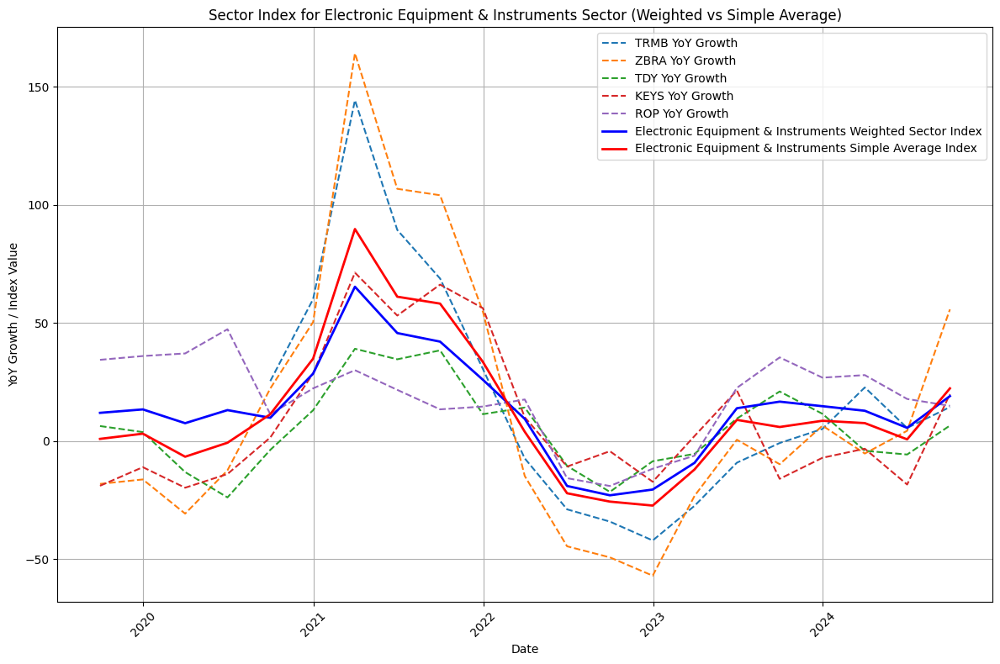

Processing Rail Transportation sector...
Leader for Rail Transportation sector: UNP
Descending order of companies by overperformance in Rail Transportation sector:
UNP: 14 times overperformed
CSX: 9 times overperformed
NSC: 8 times overperformed
Saved sector index for Rail Transportation to sector_wise_index/Rail Transportation_sector_index.csv


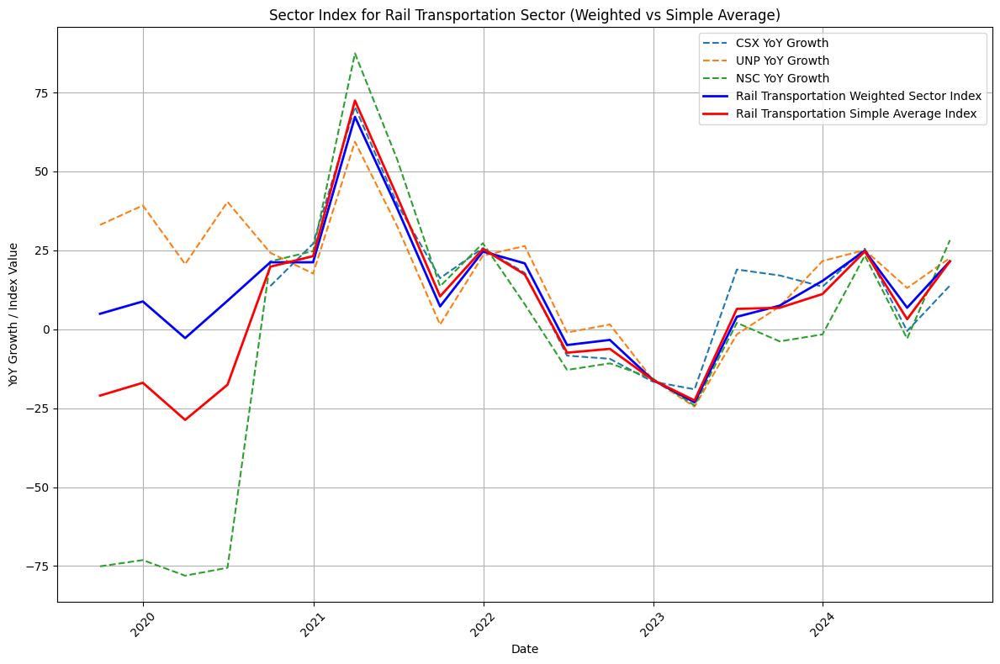

Processing Health Care Equipment sector...
Leader for Health Care Equipment sector: ISRG
Descending order of companies by overperformance in Health Care Equipment sector:
ISRG: 17 times overperformed
BSX: 13 times overperformed
ABT: 13 times overperformed
IDXX: 12 times overperformed
SYK: 12 times overperformed
DXCM: 11 times overperformed
RMD: 10 times overperformed
HOLX: 9 times overperformed
PODD: 9 times overperformed
STE: 9 times overperformed
RVTY: 8 times overperformed
EW: 7 times overperformed
MDT: 7 times overperformed
ZBH: 7 times overperformed
BDX: 5 times overperformed
GEHC: 4 times overperformed
BAX: 1 times overperformed
TFX: 1 times overperformed
Saved sector index for Health Care Equipment to sector_wise_index/Health Care Equipment_sector_index.csv


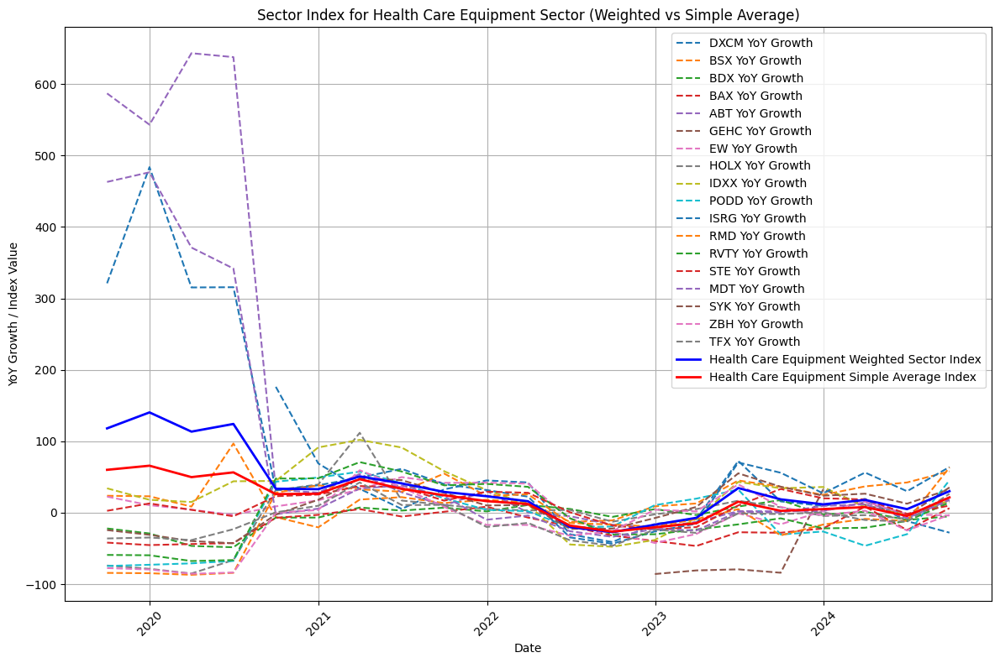

Processing Paper & Plastic Packaging Products & Materials sector...
Leader for Paper & Plastic Packaging Products & Materials sector: AVY
Descending order of companies by overperformance in Paper & Plastic Packaging Products & Materials sector:
AVY: 14 times overperformed
PKG: 11 times overperformed
IP: 11 times overperformed
AMCR: 5 times overperformed
Saved sector index for Paper & Plastic Packaging Products & Materials to sector_wise_index/Paper & Plastic Packaging Products & Materials_sector_index.csv


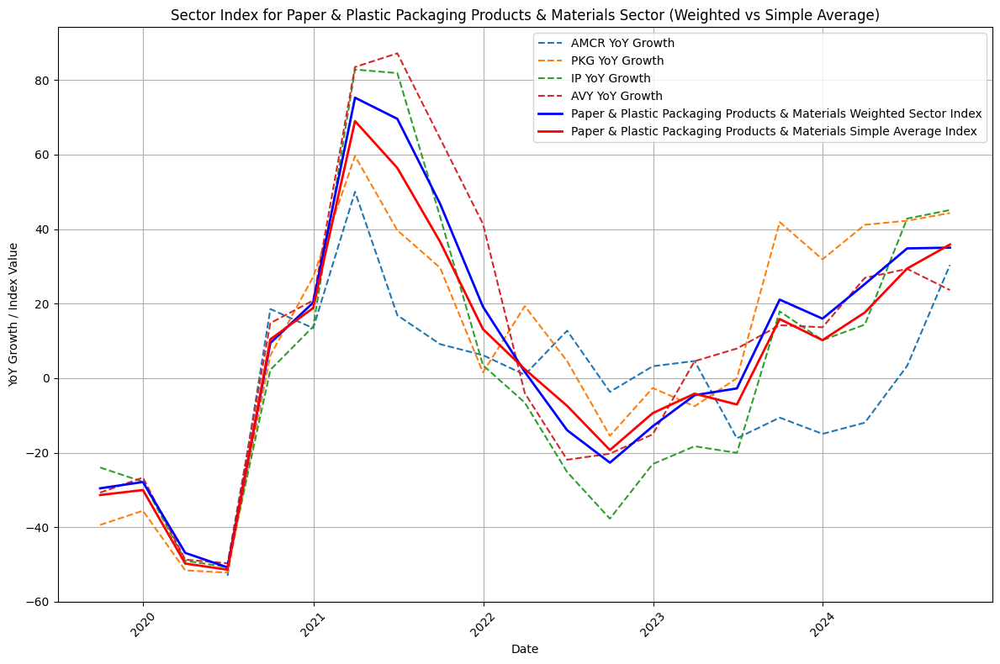

Processing Transaction & Payment Processing Services sector...
Leader for Transaction & Payment Processing Services sector: V
Descending order of companies by overperformance in Transaction & Payment Processing Services sector:
V: 16 times overperformed
MA: 14 times overperformed
FI: 12 times overperformed
CPAY: 9 times overperformed
FIS: 7 times overperformed
PYPL: 6 times overperformed
JKHY: 5 times overperformed
GPN: 2 times overperformed
Saved sector index for Transaction & Payment Processing Services to sector_wise_index/Transaction & Payment Processing Services_sector_index.csv


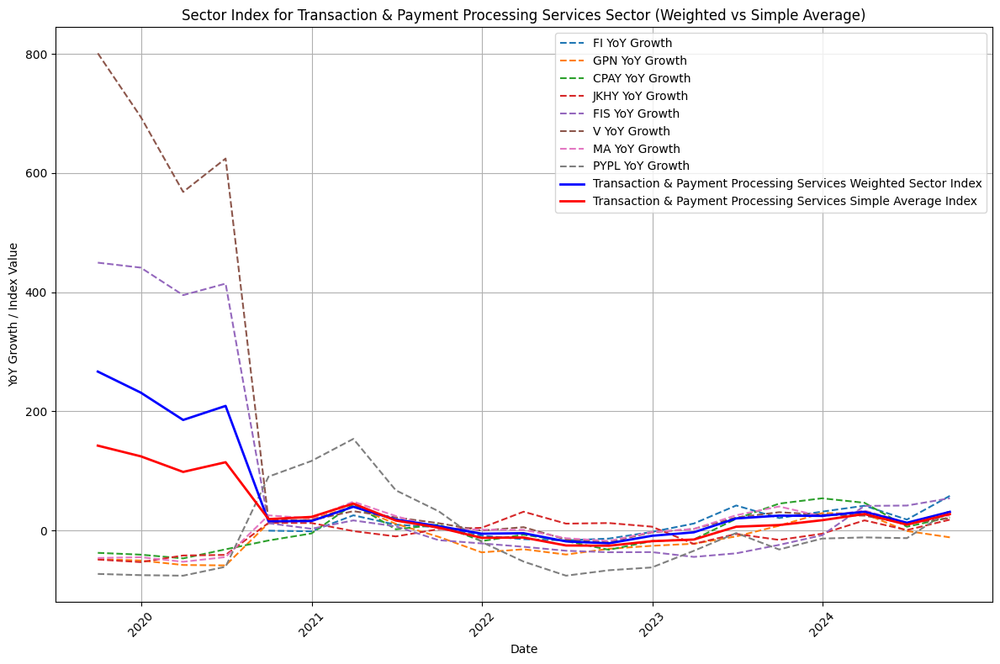

Processing Soft Drinks & Non-alcoholic Beverages sector...
Leader for Soft Drinks & Non-alcoholic Beverages sector: KO
Descending order of companies by overperformance in Soft Drinks & Non-alcoholic Beverages sector:
KO: 12 times overperformed
MNST: 10 times overperformed
PEP: 8 times overperformed
KDP: 8 times overperformed
Saved sector index for Soft Drinks & Non-alcoholic Beverages to sector_wise_index/Soft Drinks & Non-alcoholic Beverages_sector_index.csv


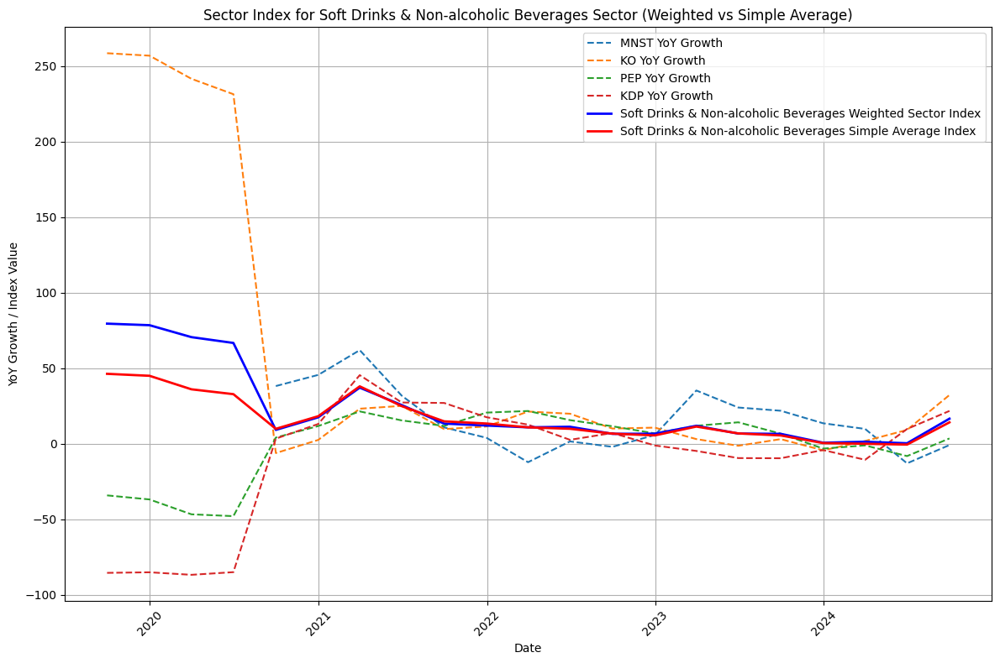

Processing Multi-Family Residential REITs sector...
Leader for Multi-Family Residential REITs sector: MAA
Descending order of companies by overperformance in Multi-Family Residential REITs sector:
MAA: 15 times overperformed
EQR: 12 times overperformed
AVB: 11 times overperformed
CPT: 9 times overperformed
ESS: 6 times overperformed
UDR: 4 times overperformed
Saved sector index for Multi-Family Residential REITs to sector_wise_index/Multi-Family Residential REITs_sector_index.csv


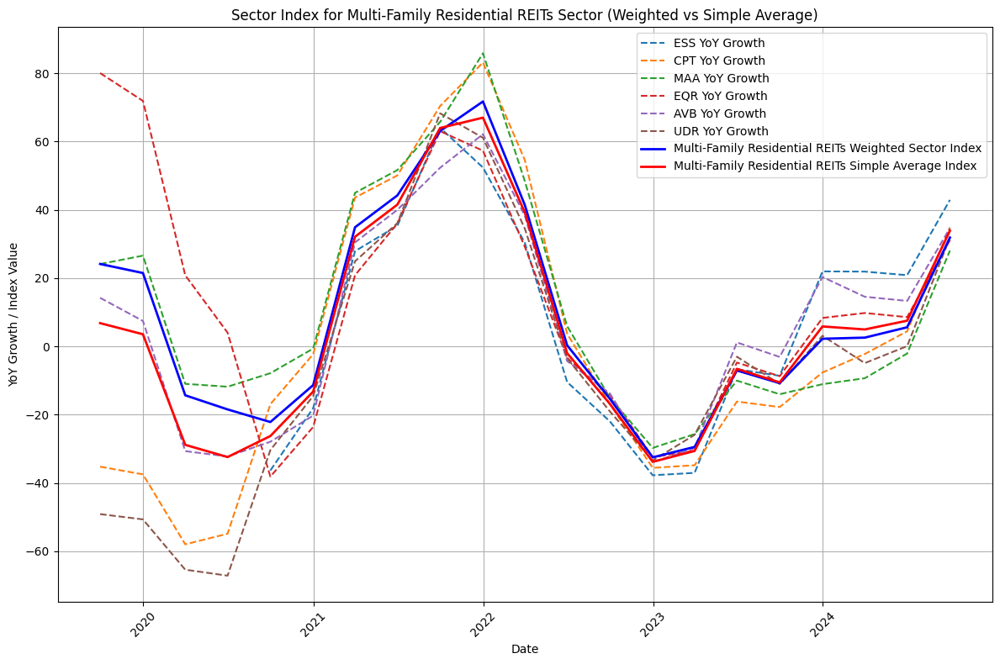

Processing Consumer Finance sector...
Leader for Consumer Finance sector: AXP
Descending order of companies by overperformance in Consumer Finance sector:
AXP: 15 times overperformed
COF: 12 times overperformed
DFS: 10 times overperformed
SYF: 7 times overperformed
Saved sector index for Consumer Finance to sector_wise_index/Consumer Finance_sector_index.csv


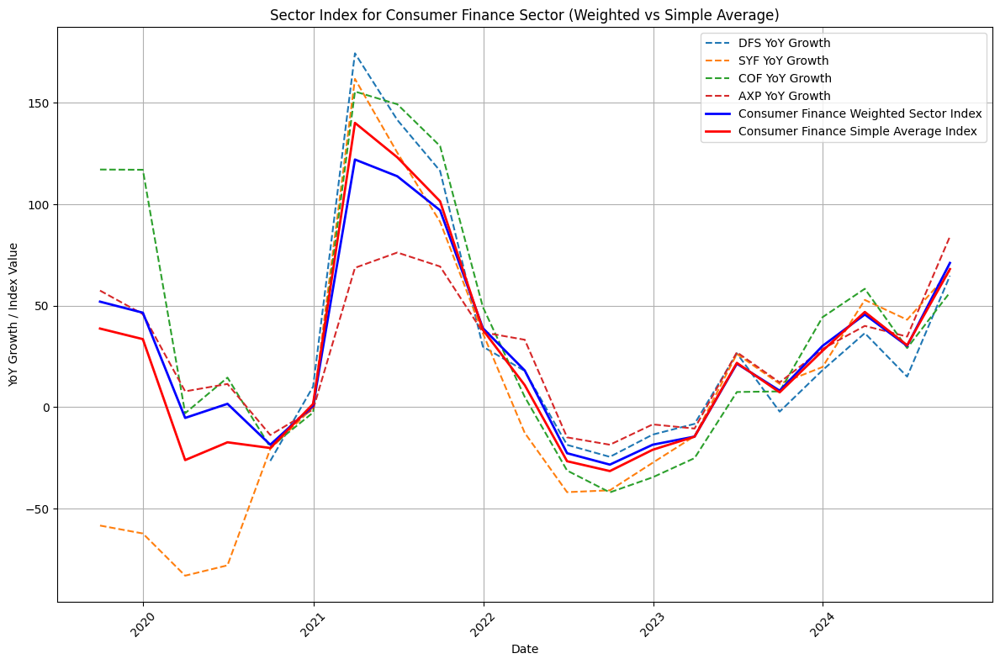

Processing Fertilizers & Agricultural Chemicals sector...
Leader for Fertilizers & Agricultural Chemicals sector: CTVA
Descending order of companies by overperformance in Fertilizers & Agricultural Chemicals sector:
CTVA: 14 times overperformed
CF: 12 times overperformed
MOS: 7 times overperformed
FMC: 5 times overperformed
Saved sector index for Fertilizers & Agricultural Chemicals to sector_wise_index/Fertilizers & Agricultural Chemicals_sector_index.csv


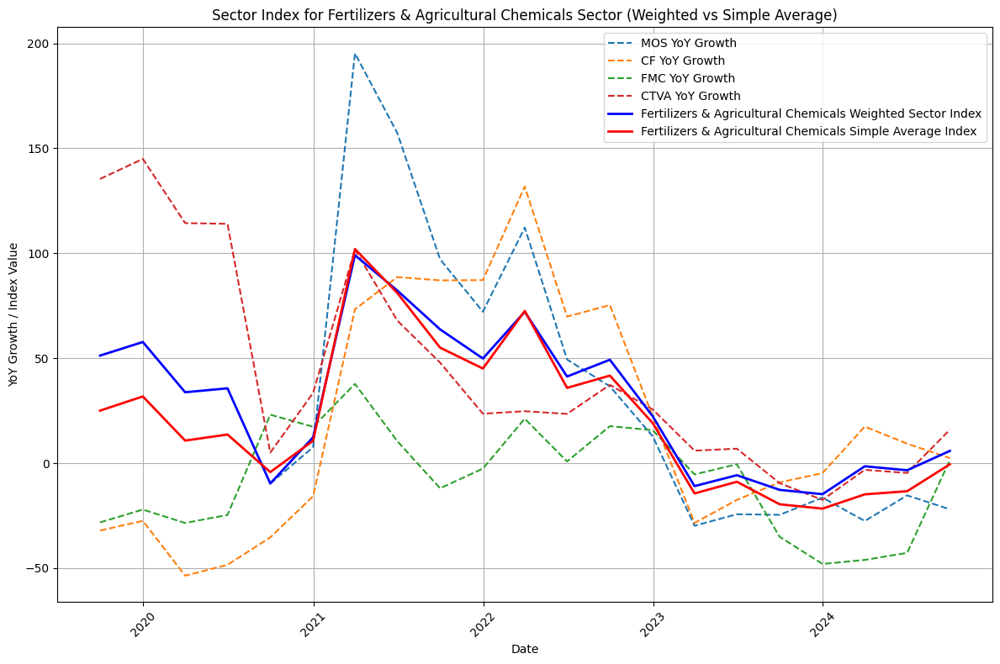

Processing Personal Care Products sector...
Leader for Personal Care Products sector: PG
Descending order of companies by overperformance in Personal Care Products sector:
PG: 16 times overperformed
EL: 5 times overperformed
KVUE: 1 times overperformed
Saved sector index for Personal Care Products to sector_wise_index/Personal Care Products_sector_index.csv


/Users/tanishkyadav/.pyenv/versions/3.10.16/envs/americanmarketanalysis/lib/python3.10/site-packages/pandas/core/indexes/base.py:7588: FutureWarning: Dtype inference on a pandas object (Series, Index, ExtensionArray) is deprecated. The Index constructor will keep the original dtype in the future. Call `infer_objects` on the result to get the old behavior.
  return Index(sequences[0], name=names)


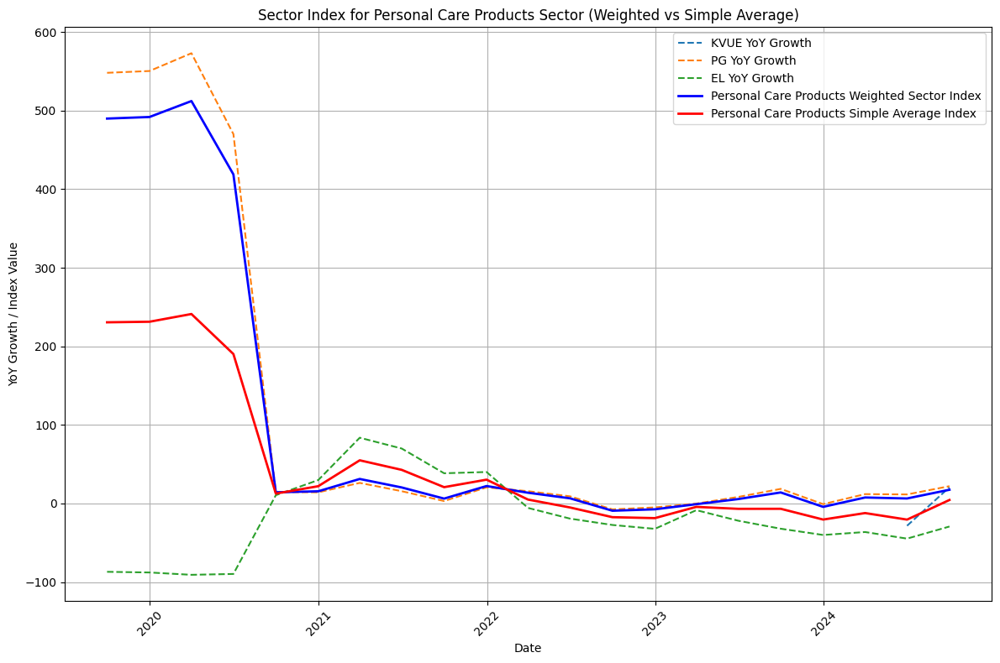

Processing Life & Health Insurance sector...
Leader for Life & Health Insurance sector: AFL
Descending order of companies by overperformance in Life & Health Insurance sector:
AFL: 16 times overperformed
PRU: 14 times overperformed
MET: 11 times overperformed
PFG: 11 times overperformed
GL: 5 times overperformed
Saved sector index for Life & Health Insurance to sector_wise_index/Life & Health Insurance_sector_index.csv


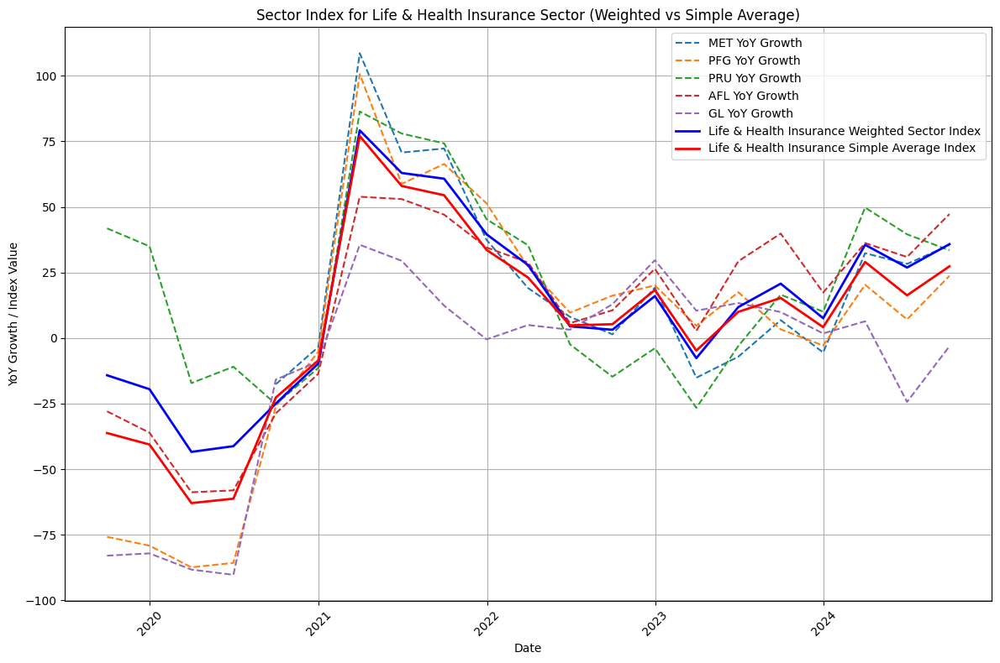

Processing Oil & Gas Refining & Marketing sector...
Leader for Oil & Gas Refining & Marketing sector: MPC
Descending order of companies by overperformance in Oil & Gas Refining & Marketing sector:
MPC: 17 times overperformed
VLO: 9 times overperformed
PSX: 6 times overperformed
Saved sector index for Oil & Gas Refining & Marketing to sector_wise_index/Oil & Gas Refining & Marketing_sector_index.csv


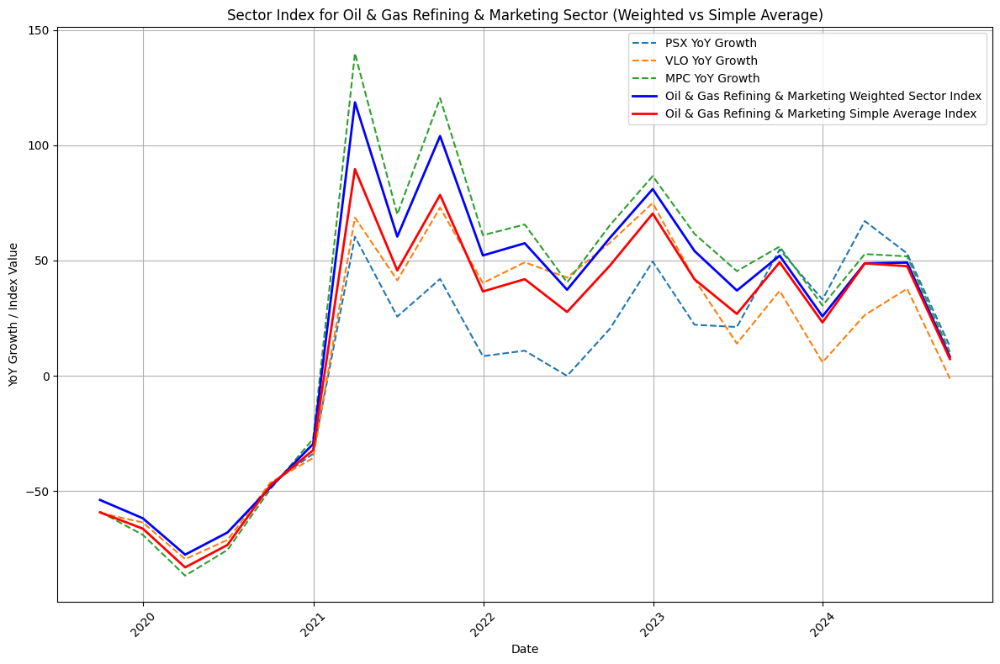

Processing Insurance Brokers sector...
Leader for Insurance Brokers sector: AJG
Descending order of companies by overperformance in Insurance Brokers sector:
AJG: 18 times overperformed
BRO: 12 times overperformed
MMC: 12 times overperformed
ERIE: 10 times overperformed
AON: 5 times overperformed
WTW: 1 times overperformed
Saved sector index for Insurance Brokers to sector_wise_index/Insurance Brokers_sector_index.csv


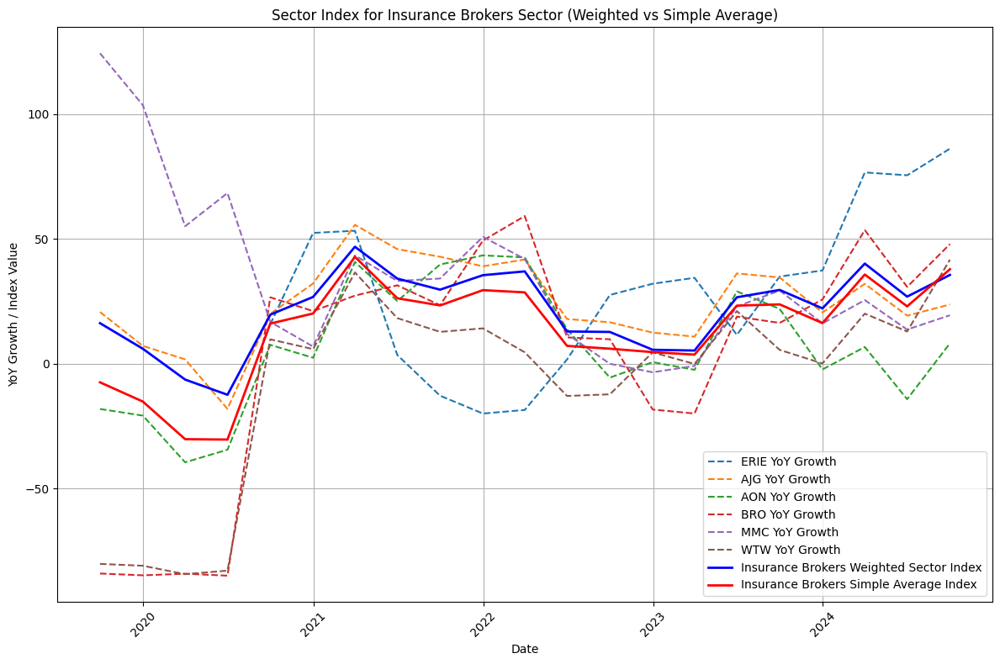

Processing Health Care Services sector...
Leader for Health Care Services sector: CI
Descending order of companies by overperformance in Health Care Services sector:
CI: 11 times overperformed
DVA: 9 times overperformed
CVS: 9 times overperformed
LH: 7 times overperformed
DGX: 6 times overperformed
Saved sector index for Health Care Services to sector_wise_index/Health Care Services_sector_index.csv


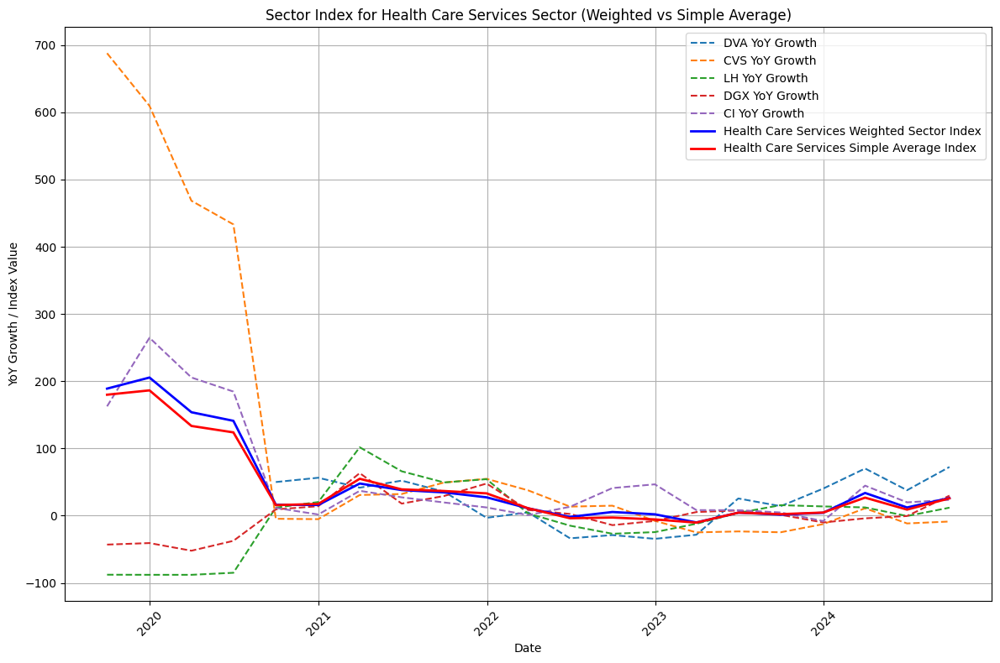

Processing Restaurants sector...
Leader for Restaurants sector: CMG
Descending order of companies by overperformance in Restaurants sector:
CMG: 11 times overperformed
DRI: 9 times overperformed
MCD: 9 times overperformed
YUM: 8 times overperformed
DPZ: 7 times overperformed
SBUX: 4 times overperformed
Saved sector index for Restaurants to sector_wise_index/Restaurants_sector_index.csv


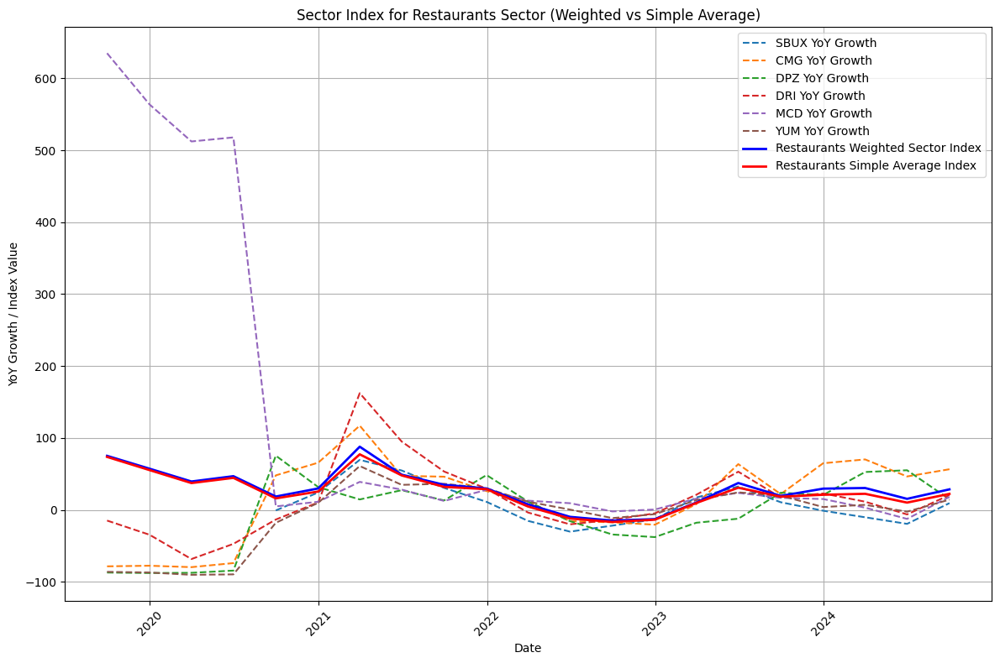

Processing Financial Exchanges & Data sector...
Leader for Financial Exchanges & Data sector: NDAQ
Descending order of companies by overperformance in Financial Exchanges & Data sector:
NDAQ: 16 times overperformed
SPGI: 14 times overperformed
CBOE: 13 times overperformed
CME: 12 times overperformed
ICE: 10 times overperformed
MCO: 10 times overperformed
MSCI: 10 times overperformed
FDS: 7 times overperformed
MKTX: 4 times overperformed
Saved sector index for Financial Exchanges & Data to sector_wise_index/Financial Exchanges & Data_sector_index.csv


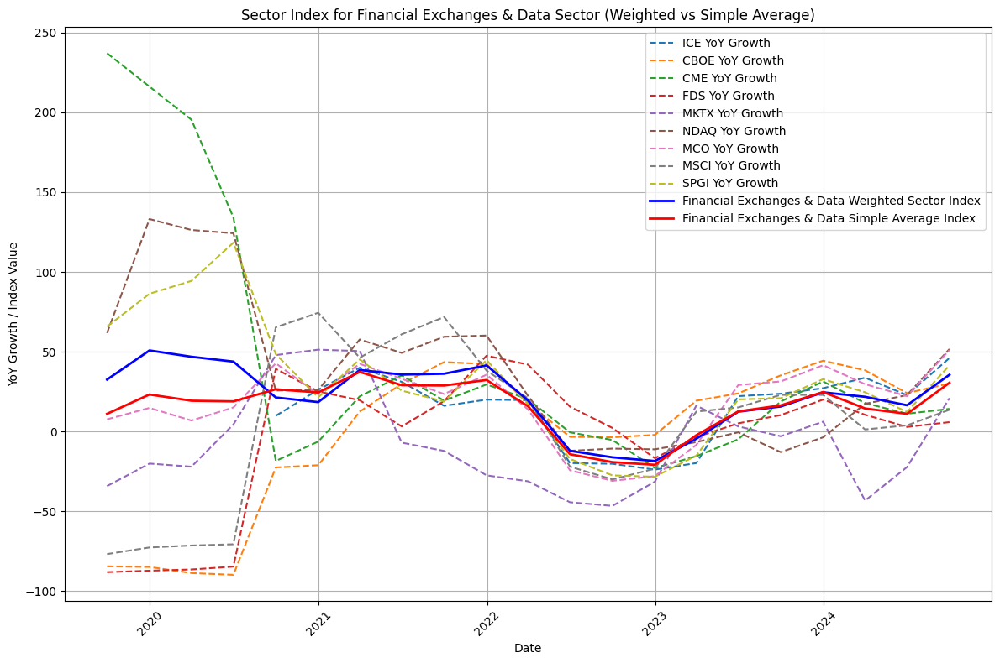

Processing Broadcasting sector...
Leader for Broadcasting sector: FOXA
Descending order of companies by overperformance in Broadcasting sector:
FOXA: 14 times overperformed
FOX: 13 times overperformed
WBD: 8 times overperformed
Saved sector index for Broadcasting to sector_wise_index/Broadcasting_sector_index.csv


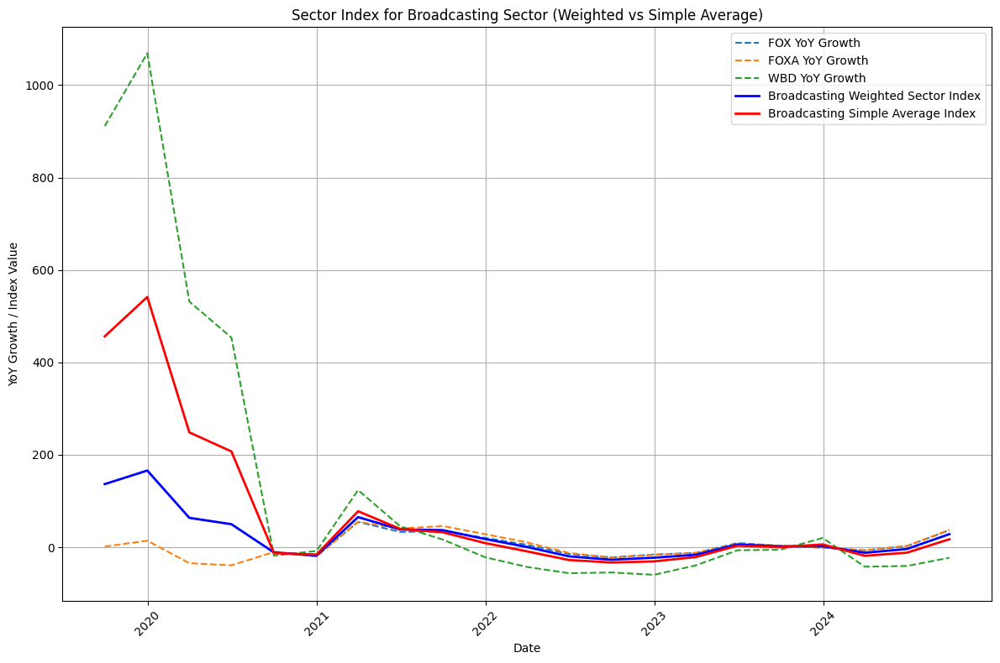

Processing Multi-Utilities sector...
Leader for Multi-Utilities sector: PCG
Descending order of companies by overperformance in Multi-Utilities sector:
PCG: 15 times overperformed
CNP: 13 times overperformed
NEE: 11 times overperformed
ED: 10 times overperformed
DTE: 10 times overperformed
SRE: 10 times overperformed
NI: 9 times overperformed
CMS: 7 times overperformed
PNW: 7 times overperformed
D: 6 times overperformed
AEE: 5 times overperformed
XEL: 2 times overperformed
Saved sector index for Multi-Utilities to sector_wise_index/Multi-Utilities_sector_index.csv


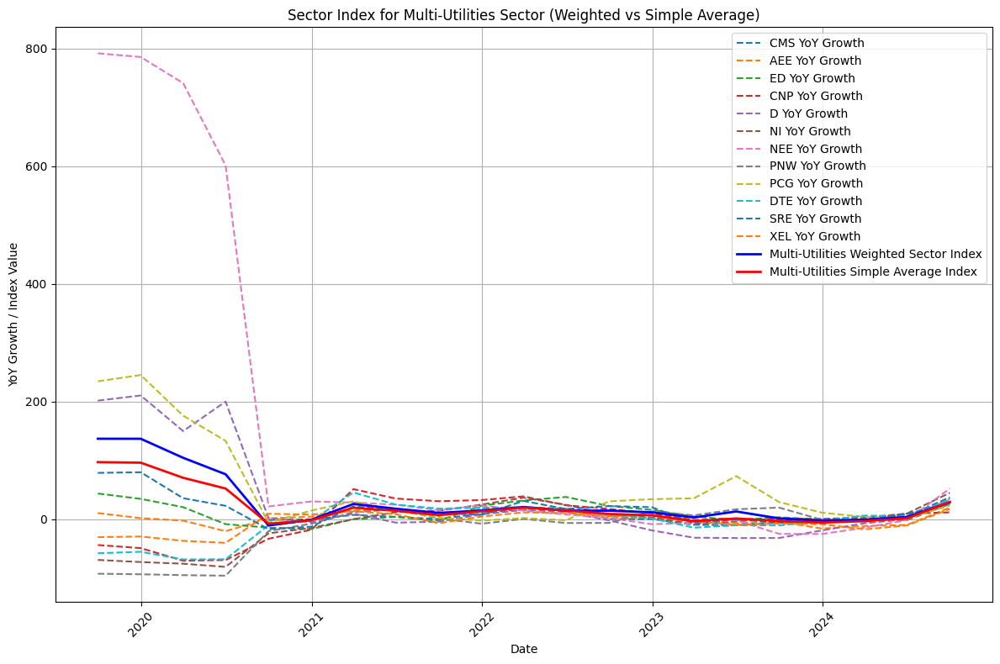

Processing Managed Health Care sector...
Leader for Managed Health Care sector: UNH
Descending order of companies by overperformance in Managed Health Care sector:
UNH: 20 times overperformed
MOH: 12 times overperformed
ELV: 11 times overperformed
HUM: 6 times overperformed
CNC: 3 times overperformed
Saved sector index for Managed Health Care to sector_wise_index/Managed Health Care_sector_index.csv


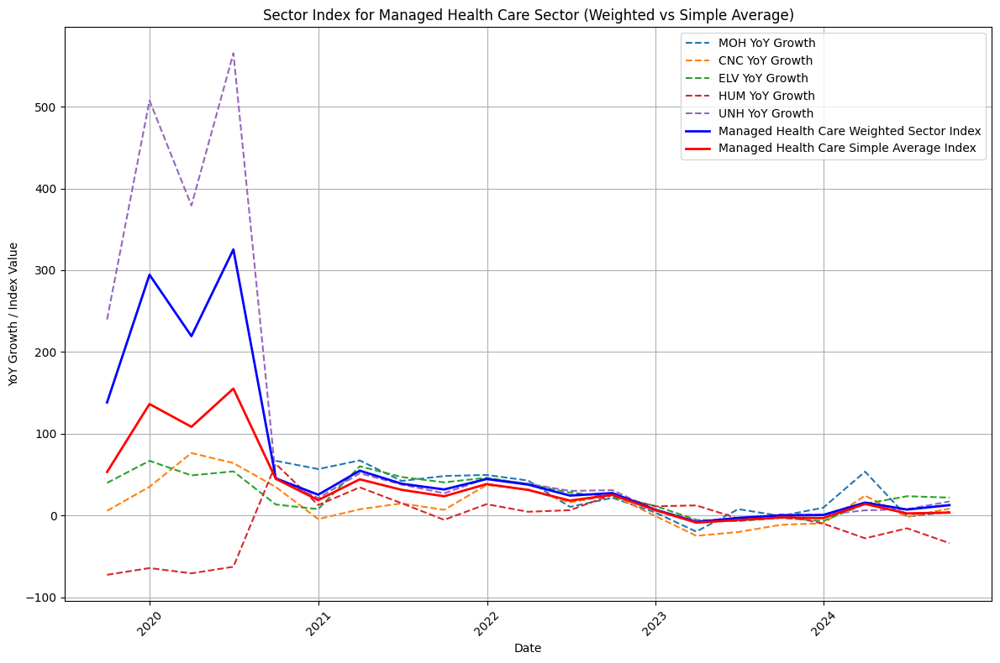

Processing Diversified Support Services sector...
Leader for Diversified Support Services sector: CTAS
Descending order of companies by overperformance in Diversified Support Services sector:
CTAS: 18 times overperformed
CPRT: 12 times overperformed
LDOS: 5 times overperformed
Saved sector index for Diversified Support Services to sector_wise_index/Diversified Support Services_sector_index.csv


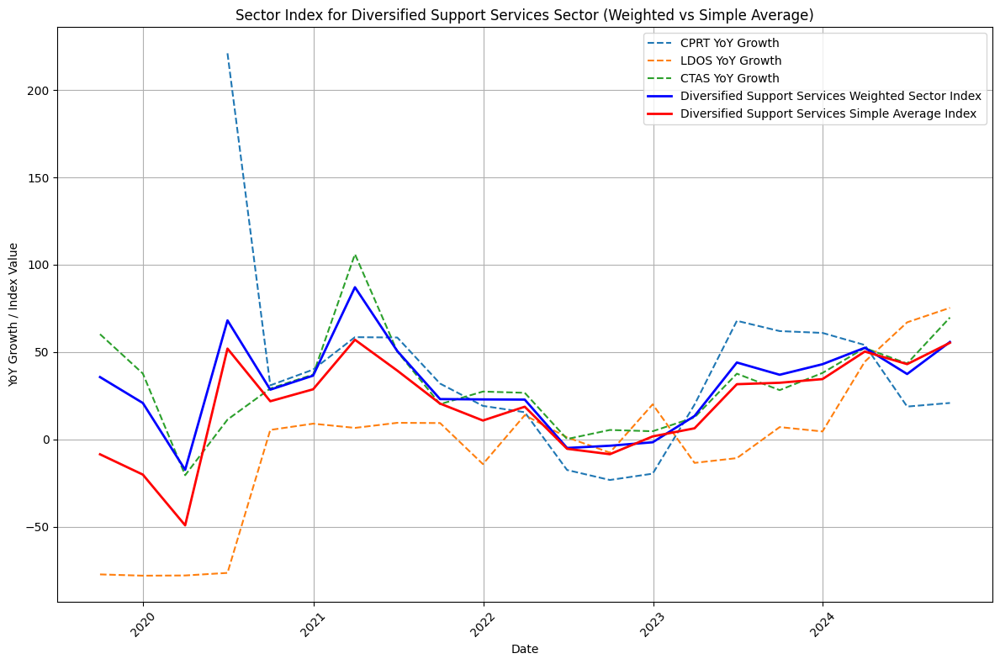

Processing Regional Banks sector...
Leader for Regional Banks sector: FITB
Descending order of companies by overperformance in Regional Banks sector:
FITB: 17 times overperformed
RF: 13 times overperformed
MTB: 10 times overperformed
CFG: 8 times overperformed
KEY: 6 times overperformed
HBAN: 5 times overperformed
Saved sector index for Regional Banks to sector_wise_index/Regional Banks_sector_index.csv


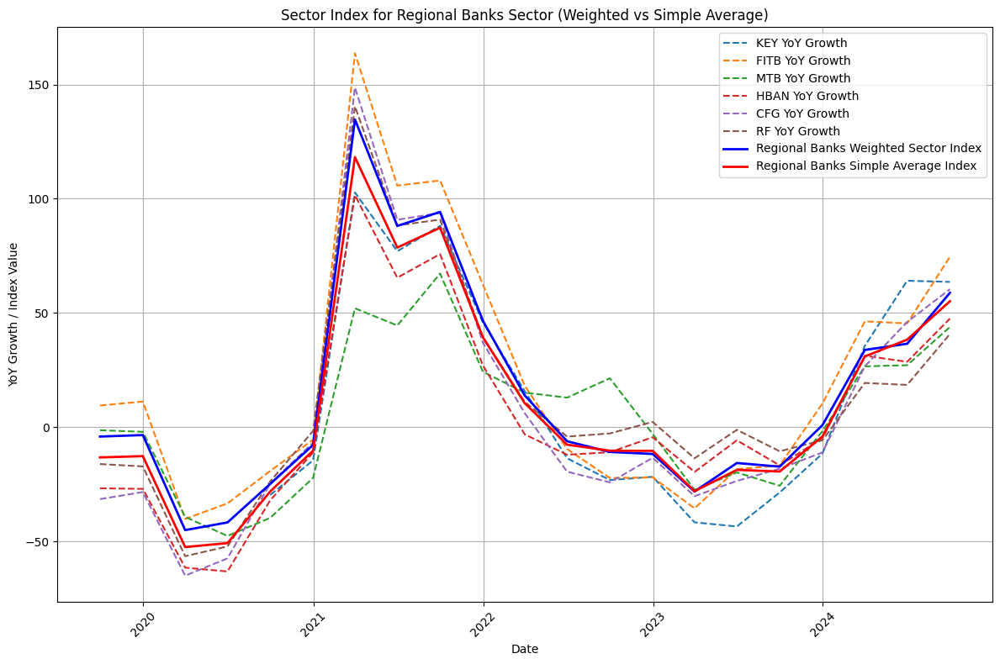

Processing IT Consulting & Other Services sector...
Leader for IT Consulting & Other Services sector: IT
Descending order of companies by overperformance in IT Consulting & Other Services sector:
IT: 15 times overperformed
ACN: 11 times overperformed
IBM: 8 times overperformed
EPAM: 7 times overperformed
CTSH: 4 times overperformed
Saved sector index for IT Consulting & Other Services to sector_wise_index/IT Consulting & Other Services_sector_index.csv


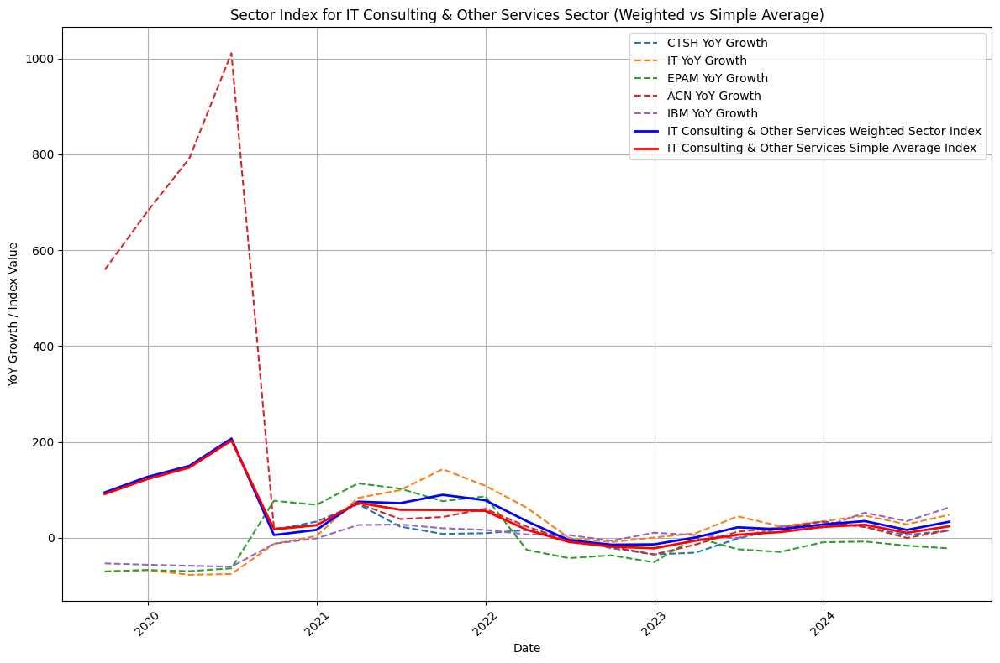

Processing Life Sciences Tools & Services sector...
Leader for Life Sciences Tools & Services sector: DHR
Descending order of companies by overperformance in Life Sciences Tools & Services sector:
DHR: 14 times overperformed
TMO: 13 times overperformed
WAT: 11 times overperformed
MTD: 10 times overperformed
CRL: 9 times overperformed
IQV: 8 times overperformed
A: 7 times overperformed
TECH: 4 times overperformed
Saved sector index for Life Sciences Tools & Services to sector_wise_index/Life Sciences Tools & Services_sector_index.csv


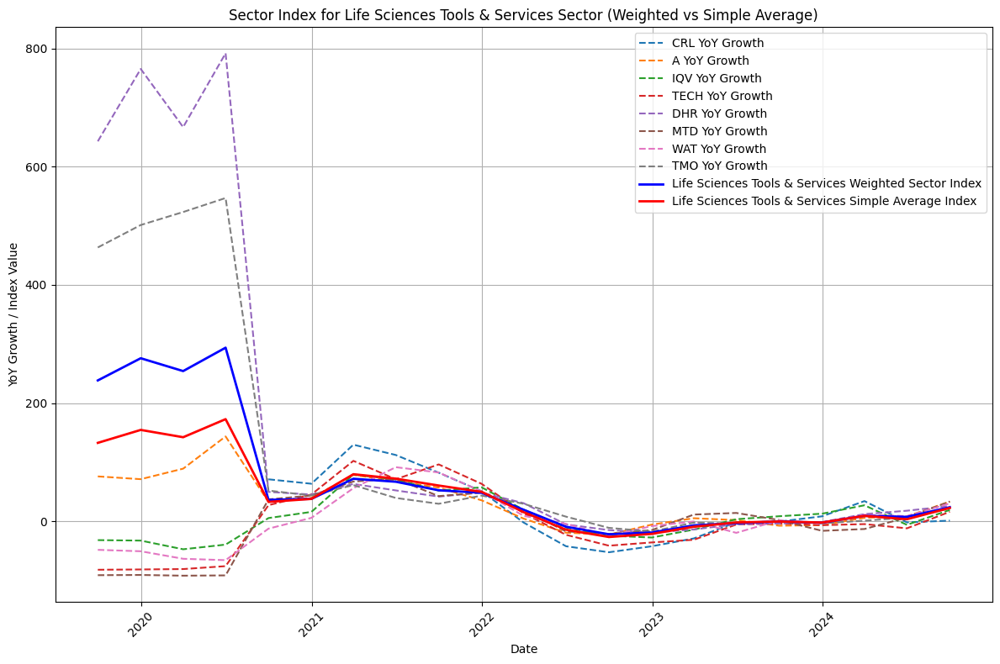

Processing Health Care REITs sector...
Leader for Health Care REITs sector: WELL
Descending order of companies by overperformance in Health Care REITs sector:
WELL: 13 times overperformed
VTR: 10 times overperformed
DOC: 7 times overperformed
Saved sector index for Health Care REITs to sector_wise_index/Health Care REITs_sector_index.csv


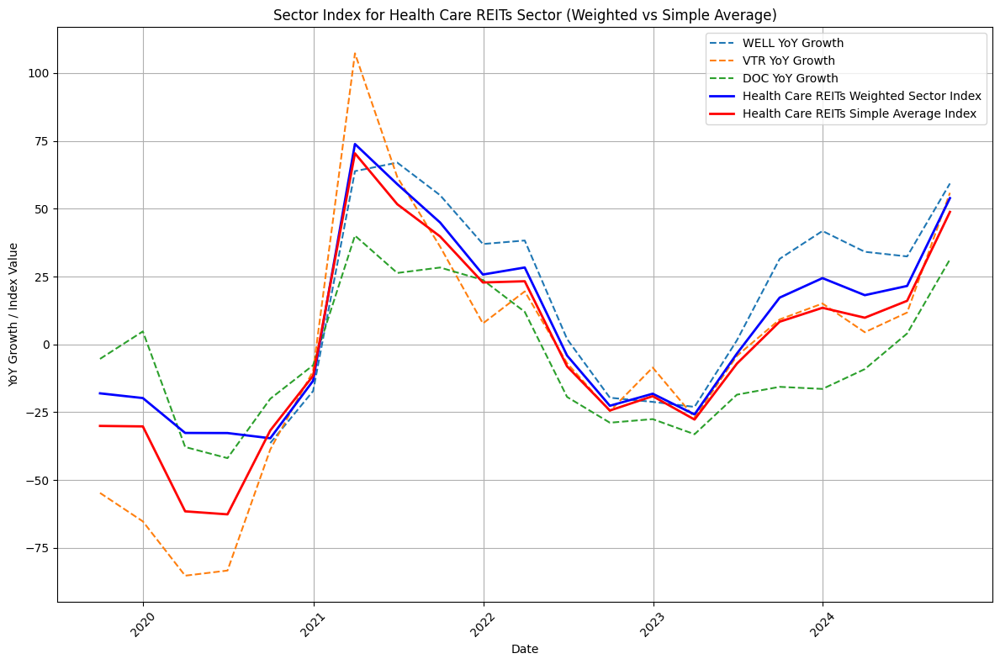

Processing Homebuilding sector...
Leader for Homebuilding sector: DHI
Descending order of companies by overperformance in Homebuilding sector:
DHI: 14 times overperformed
PHM: 10 times overperformed
LEN: 6 times overperformed
NVR: 4 times overperformed
Saved sector index for Homebuilding to sector_wise_index/Homebuilding_sector_index.csv


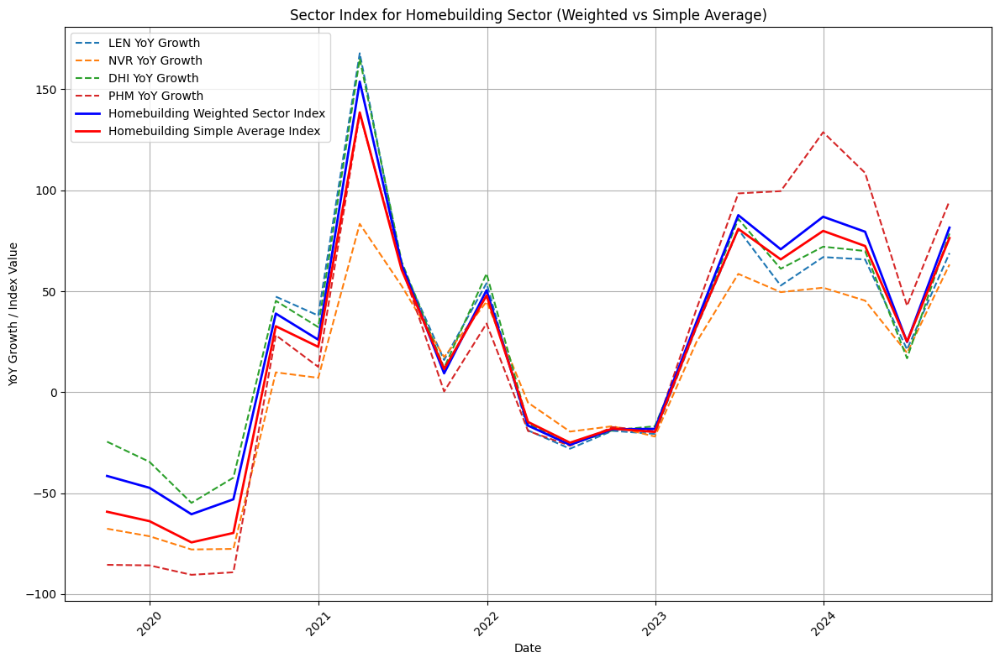

Processing Property & Casualty Insurance sector...
Leader for Property & Casualty Insurance sector: HIG
Descending order of companies by overperformance in Property & Casualty Insurance sector:
HIG: 12 times overperformed
PGR: 12 times overperformed
ALL: 9 times overperformed
CB: 9 times overperformed
ACGL: 7 times overperformed
WRB: 7 times overperformed
CINF: 4 times overperformed
TRV: 4 times overperformed
Saved sector index for Property & Casualty Insurance to sector_wise_index/Property & Casualty Insurance_sector_index.csv


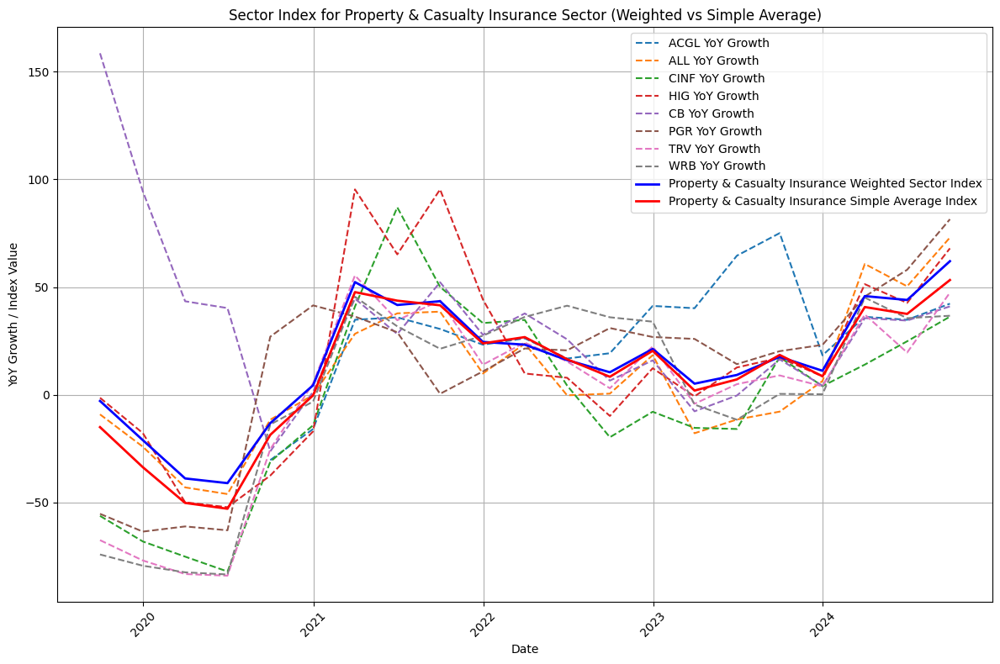

Processing Multi-line Insurance sector...
Leader for Multi-line Insurance sector: AIG
Descending order of companies by overperformance in Multi-line Insurance sector:
AIG: 14 times overperformed
AIZ: 8 times overperformed
L: 7 times overperformed
Saved sector index for Multi-line Insurance to sector_wise_index/Multi-line Insurance_sector_index.csv


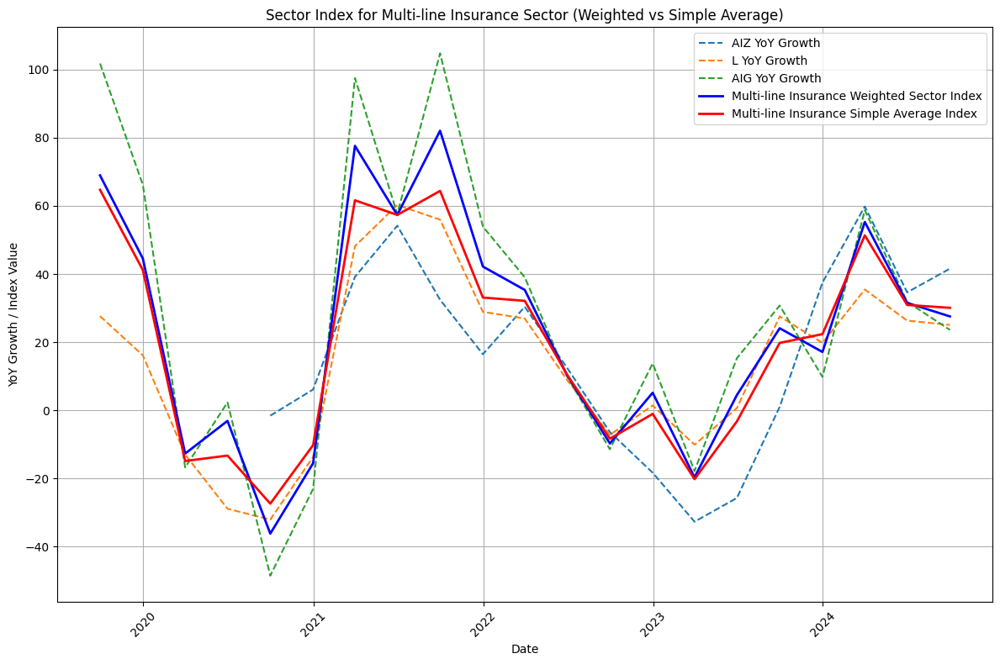

Processing Technology Hardware, Storage & Peripherals sector...
Leader for Technology Hardware, Storage & Peripherals sector: SMCI
Descending order of companies by overperformance in Technology Hardware, Storage & Peripherals sector:
SMCI: 13 times overperformed
DELL: 11 times overperformed
AAPL: 10 times overperformed
HPQ: 7 times overperformed
STX: 5 times overperformed
NTAP: 4 times overperformed
HPE: 3 times overperformed
WDC: 2 times overperformed
Saved sector index for Technology Hardware, Storage & Peripherals to sector_wise_index/Technology Hardware, Storage & Peripherals_sector_index.csv


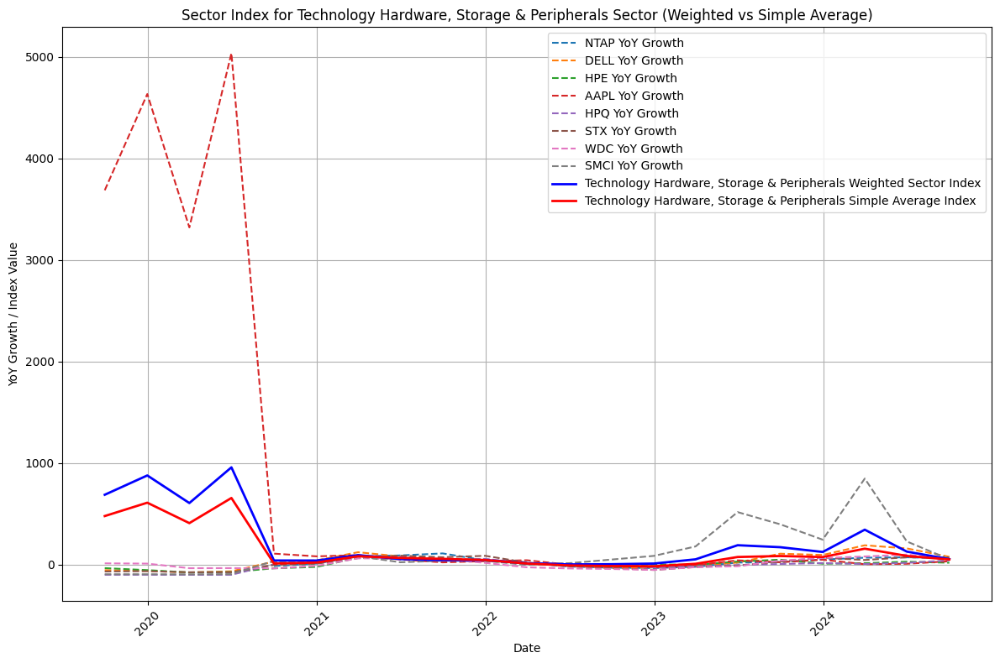

Processing Oil & Gas Storage & Transportation sector...
Leader for Oil & Gas Storage & Transportation sector: TRGP
Descending order of companies by overperformance in Oil & Gas Storage & Transportation sector:
TRGP: 15 times overperformed
OKE: 7 times overperformed
KMI: 6 times overperformed
WMB: 6 times overperformed
Saved sector index for Oil & Gas Storage & Transportation to sector_wise_index/Oil & Gas Storage & Transportation_sector_index.csv


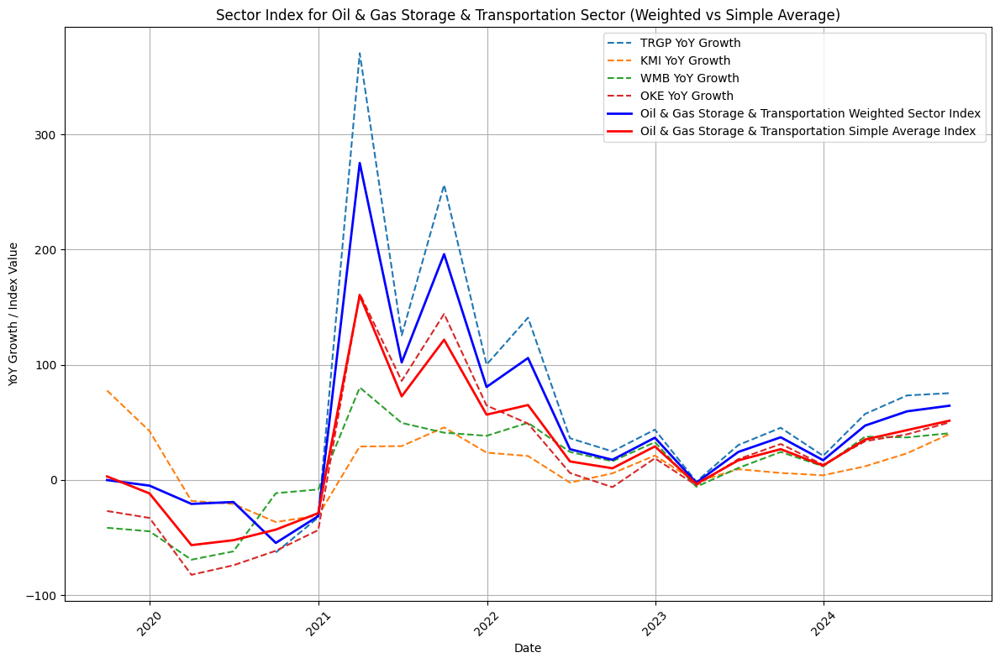

Processing Pharmaceuticals sector...
Leader for Pharmaceuticals sector: LLY
Descending order of companies by overperformance in Pharmaceuticals sector:
LLY: 21 times overperformed
PFE: 10 times overperformed
ZTS: 9 times overperformed
CTLT: 7 times overperformed
MRK: 7 times overperformed
BMY: 5 times overperformed
VTRS: 5 times overperformed
JNJ: 2 times overperformed
Saved sector index for Pharmaceuticals to sector_wise_index/Pharmaceuticals_sector_index.csv


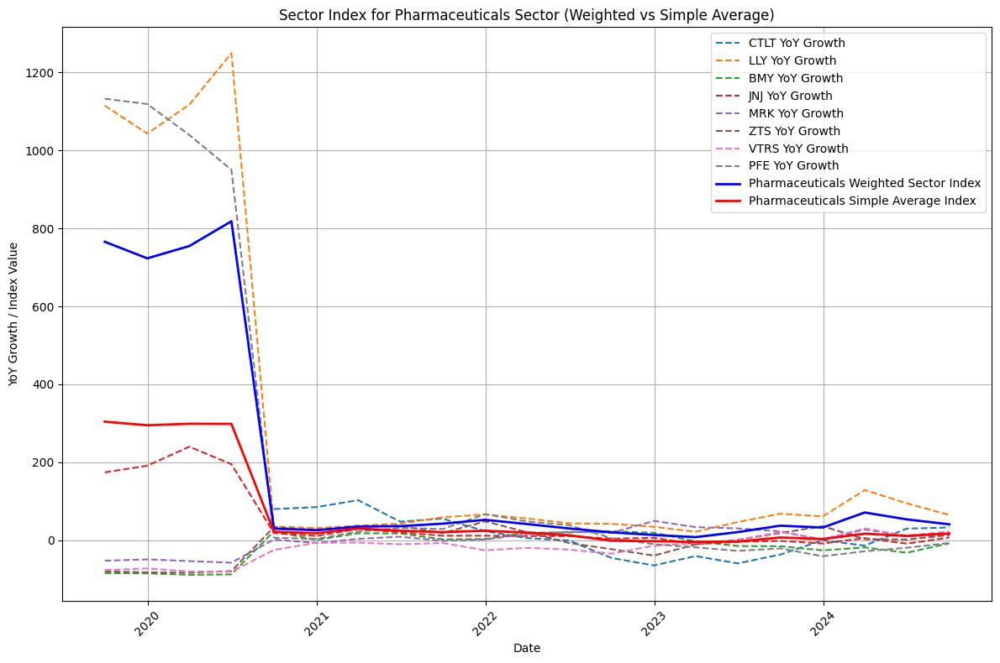

Processing Human Resource & Employment Services sector...
Leader for Human Resource & Employment Services sector: ADP
Descending order of companies by overperformance in Human Resource & Employment Services sector:
ADP: 16 times overperformed
PAYX: 11 times overperformed
DAY: 7 times overperformed
PAYC: 4 times overperformed
Saved sector index for Human Resource & Employment Services to sector_wise_index/Human Resource & Employment Services_sector_index.csv


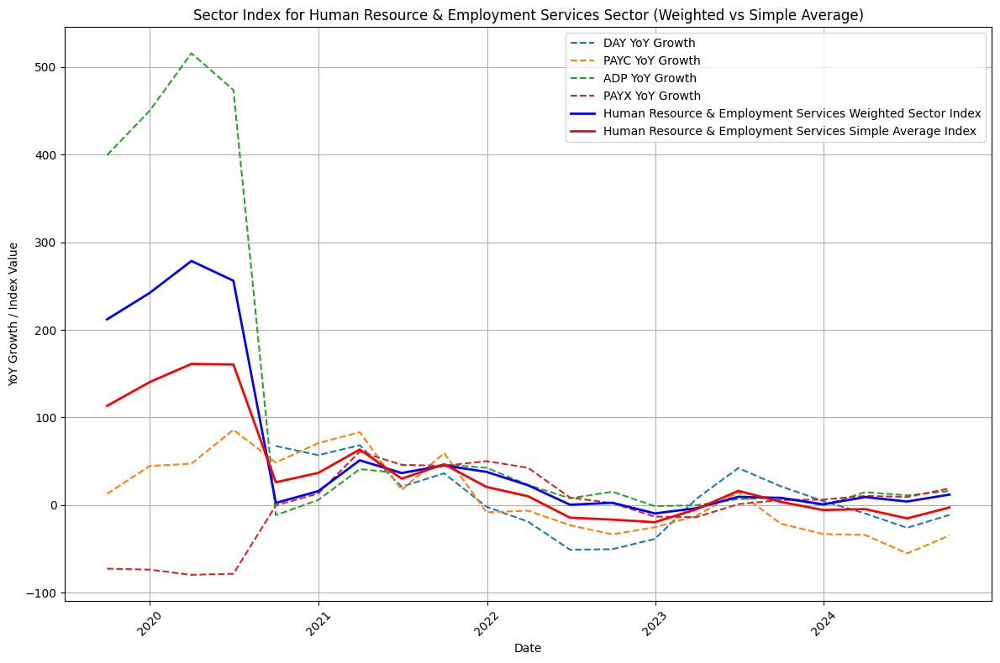

In [6]:
def main():
    # Path to the directory where sector CSV files are saved
    input_dir = "sector_mkt_cap_results"
    output_dir = "sector_wise_index"  # Directory to save sector indices

    # Create output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Process each sector CSV
    for sector_file in os.listdir(input_dir):
        if sector_file.endswith(".csv"):
            sector = sector_file.replace("_mkt_cap_quarter_end.csv", "")
            print(f"Processing {sector} sector...")

            # Load the CSV file
            file_path = os.path.join(input_dir, sector_file)
            df = pd.read_csv(file_path, parse_dates=['Date'])

            # Calculate YoY growth and apply log10 transformation
            df = calculate_yoy_growth(df)
            df = apply_log10_transformation(df)

            # Calculate sector leader, ranking and total overperformance count
            sector_leader, sorted_companies, total_overperformance = calculate_sector_leader_and_rank(df, sector)

            # Calculate the sector index based on fractional contributions
            sector_weighted_index = calculate_sector_index(df, sorted_companies, total_overperformance)

            # Calculate the simple average index
            simple_avg_index = calculate_simple_average_index(df)

            # Merge sector_index and simple_avg_index for saving
            combined_index = pd.merge(sector_weighted_index, simple_avg_index, on='Date', how='outer')

            # Save the sector index data to a CSV file
            output_file_path = os.path.join(output_dir, f"{sector}_sector_index.csv")
            combined_index.to_csv(output_file_path, index=False)
            print(f"Saved sector index for {sector} to {output_file_path}")

            # Plot the sector index (both weighted and simple average) alongside stock values
            plot_sector_index(sector_weighted_index, simple_avg_index, df, sector)

if __name__ == "__main__":
    main()

## Stage 2: Data Merging and Growth Analysis

### Key Functions

#### `merge_sector_data(mkt_cap_dir, revenue_dir, output_dir)`
- **Purpose**: Merges market cap and revenue data for sectors
- **Input**: 
  - Directory paths for market cap and revenue data
  - Output directory path
- **Output**: Dictionary of merged sector DataFrames
- **Key Operations**:
  - Identifies common sectors between datasets
  - Aligns quarterly market cap with revenue data
  - Handles date formatting and matching


In [7]:
def merge_sector_data(mkt_cap_dir, revenue_dir, output_dir="merged_sector_data"):
    """
    Merge market cap and revenue data for sectors where both datasets are available.
    Handles specific CSV structures with quarterly market cap and yearly revenue data.
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    merged_sectors = {}
    
    # Get list of sectors from both directories
    mkt_cap_sectors = {f.split('_mkt_cap')[0] for f in os.listdir(mkt_cap_dir) if f.endswith('.csv')}
    revenue_sectors = {f.split('_revenue')[0] for f in os.listdir(revenue_dir) if f.endswith('.csv')}
    
    # Find common sectors
    common_sectors = mkt_cap_sectors.intersection(revenue_sectors)
    
    for sector in common_sectors:
        print(f"Processing sector: {sector}")
        
        # Read market cap data
        mkt_cap_file = f"{sector}_mkt_cap_quarter_end.csv"
        mkt_cap_path = os.path.join(mkt_cap_dir, mkt_cap_file)
        mkt_cap_df = pd.read_csv(mkt_cap_path)
        
        # Read revenue data
        revenue_file = f"{sector}_revenue.csv"
        revenue_path = os.path.join(revenue_dir, revenue_file)
        revenue_df = pd.read_csv(revenue_path)
        
        # Clean and convert dates
        try:
            # Handle the specific date format in market cap data
            mkt_cap_df['Date'] = pd.to_datetime(mkt_cap_df['Date'].str.split(' ').str[0])
        except AttributeError:
            mkt_cap_df['Date'] = pd.to_datetime(mkt_cap_df['Date'])
            
        revenue_df['date'] = pd.to_datetime(revenue_df['date'])
        
        # Extract year and quarter
        mkt_cap_df['year'] = pd.DatetimeIndex(mkt_cap_df['Date']).year
        mkt_cap_df['quarter'] = pd.DatetimeIndex(mkt_cap_df['Date']).quarter
        
        # Create a list to store merged data for each ticker
        merged_data = []
        
        # Get unique tickers from both datasets
        mkt_cap_df['Ticker'] = mkt_cap_df['Ticker'].str.upper()
        revenue_df['ticker'] = revenue_df['ticker'].str.upper()
        
        common_tickers = set(mkt_cap_df['Ticker']).intersection(set(revenue_df['ticker']))
        
        print(f"Found {len(common_tickers)} common tickers for {sector}")
        
        for ticker in common_tickers:
            ticker_mkt_cap = mkt_cap_df[mkt_cap_df['Ticker'] == ticker].copy()
            ticker_revenue = revenue_df[revenue_df['ticker'] == ticker].copy()
            
            for _, mkt_cap_row in ticker_mkt_cap.iterrows():
                matching_revenue = ticker_revenue[
                    (ticker_revenue['year'] == mkt_cap_row['year']) &
                    (ticker_revenue['quarter'] == mkt_cap_row['quarter'])
                ]
                
                if matching_revenue.empty:
                    yearly_revenue = ticker_revenue[
                        ticker_revenue['year'] == mkt_cap_row['year']
                    ]
                    if not yearly_revenue.empty:
                        revenue_value = yearly_revenue.iloc[-1]['revenue']
                        revenue_growth = yearly_revenue.iloc[-1].get('revenue_yoy_growth', np.nan)
                    else:
                        continue
                else:
                    revenue_value = matching_revenue.iloc[0]['revenue']
                    revenue_growth = matching_revenue.iloc[0].get('revenue_yoy_growth', np.nan)
                
                merged_row = {
                    'Date': mkt_cap_row['Date'],
                    'Year': mkt_cap_row['year'],
                    'Quarter': mkt_cap_row['quarter'],
                    'Ticker': ticker,
                    'MarketCap': mkt_cap_row['MarketCap'],
                    'Revenue': revenue_value,
                    'Revenue_YoY_Growth': revenue_growth,
                    'Company_Name': ticker_revenue.iloc[0].get('company_name', ticker)
                }
                merged_data.append(merged_row)
        
        if merged_data:
            merged_df = pd.DataFrame(merged_data)
            merged_df = merged_df.sort_values(['Date', 'Ticker'])
            merged_sectors[sector] = merged_df
            
            # Save merged data to a CSV file
            output_file_path = os.path.join(output_dir, f"{sector}_merged_data.csv")
            merged_df.to_csv(output_file_path, index=False)
            print(f"Successfully merged data for {sector} and saved to {output_file_path}")
        else:
            print(f"No matching data found for {sector}")
        
    return merged_sectors

#### `calculate_growth_indicator(value, mean, std_dev)`
- **Purpose**: Determines growth status based on statistical thresholds
- **Input**: 
  - Value to evaluate
  - Mean of the distribution
  - Standard deviation of the distribution
- **Output**: Growth indicator (-1, 0, or 1)
- **Thresholds**: Uses 0.07 standard deviations from mean



In [8]:
def calculate_growth_indicator(value, mean, std_dev):
    """
    Calculate the growth indicator based on sector-specific mean and standard deviation.
    Returns 1 if value is more than 0.5 standard deviations above the mean,
    -1 if it is more than 0.5 standard deviations below, and 0 if in between.
    """
    if pd.isna(value) or pd.isna(mean) or pd.isna(std_dev):
        return 0  # Return 0 if any inputs are missing (NaN)
    
    threshold_high = mean + 0.07 * std_dev
    threshold_low = mean - 0.07 * std_dev
    
    if value > threshold_high:
        return 1
    elif value < threshold_low:
        return -1
    else:
        return 0

## Stage 3: Beta Analysis and Covariance

### Core Function

#### `calculate_beta_covariance(df, period_months)`
- **Purpose**: Calculates beta covariance over specified time periods
- **Input**: 
  - Sector DataFrame
  - Analysis period in months
- **Output**: Average absolute covariance value
- **Key Operations**:
  - Calculates returns and market weights
  - Computes rolling betas
  - Handles missing values and time series alignment

In [9]:
def calculate_beta_covariance(df, period_months):
    """
    Calculate covariance of beta over a specified period with improved handling of time series.
    """
    try:
        df = df.copy()
        
        # Ensure data is sorted by date
        df = df.sort_values(['Date', 'Ticker'])
        
        # Calculate returns for each company
        df['Returns'] = df.groupby('Ticker')['MarketCap'].pct_change()
        
        # Calculate market returns (using value-weighted market return)
        df['Market_Value'] = df.groupby('Date')['MarketCap'].transform('sum')
        df['Market_Weight'] = df['MarketCap'] / df['Market_Value']
        df['Market_Returns'] = df.groupby('Date')['Returns'].transform(lambda x: (x * df.loc[x.index, 'Market_Weight']).sum())
        
        # Set minimum periods for rolling calculations
        min_periods = max(2, period_months - 1)  # Ensure at least 2 periods for correlation
        rolling_window = period_months * 3  # Convert months to quarters (assuming quarterly data)
        
        betas_by_date = []
        
        for ticker in df['Ticker'].unique():
            ticker_data = df[df['Ticker'] == ticker].copy()
            
            if len(ticker_data) >= min_periods:
                # Calculate rolling betas
                rolling_cov = (
                    ticker_data['Returns']
                    .rolling(window=rolling_window, min_periods=min_periods)
                    .cov(ticker_data['Market_Returns'])
                )
                
                rolling_market_var = (
                    ticker_data['Market_Returns']
                    .rolling(window=rolling_window, min_periods=min_periods)
                    .var()
                )
                
                # To avoid dividing by zero, handle NaN or zero variance values
                ticker_data['Beta'] = rolling_cov / rolling_market_var.replace(0, np.nan)
                
                # Store results
                betas_by_date.append(ticker_data[['Date', 'Ticker', 'Beta']].dropna())
        
        if not betas_by_date:
            return 0
        
        # Combine all beta calculations
        all_betas = pd.concat(betas_by_date)
        
        # Create a pivot table of betas (companies x dates)
        beta_matrix = all_betas.pivot_table(
            index='Ticker',
            columns='Date',
            values='Beta',
            aggfunc='first'
        )
        
        # Remove companies with too many missing values
        min_observations = beta_matrix.shape[1] * 0.5  # Require at least 50% of dates
        beta_matrix = beta_matrix[beta_matrix.count(axis=1) >= min_observations]
        
        if beta_matrix.empty:
            return 0
        
        # Fill remaining NaN values with forward fill then backward fill
        beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
        
        # Calculate covariance between different dates
        cov_matrix = beta_matrix.T.cov()
        
        # Calculate average absolute covariance (excluding diagonal)
        mask = ~np.eye(cov_matrix.shape[0], dtype=bool)
        avg_cov = np.abs(cov_matrix.where(mask)).mean().mean()
        
        return float(avg_cov) if not np.isnan(avg_cov) else 0
        
    except Exception as e:
        print(f"Error in beta covariance calculation: {e}")
        return 0
    

## Stage 4: Sector Rankings and Visualization

### Key Functions

#### `calculate_sector_rankings(merged_sectors, output_file)`
- **Purpose**: Generates comprehensive sector rankings
- **Input**: Dictionary of merged sector data
- **Output**: DataFrame with sector rankings
- **Metrics**:
  - Market Cap Growth Score
  - Revenue Growth Score
  - Weighted-Simple Variance
  - 6-month Beta Covariance
  - 4-year Beta Covariance

In [10]:
def calculate_sector_rankings(merged_sectors, output_file='sector_rankings.csv'):
    """Calculate and rank sectors based on the five specified parameters"""
    rankings = []
    
    for sector, df in merged_sectors.items():
        print(f"Processing sector: {sector}")
        try:
            # Ensure data is sorted chronologically
            df = df.sort_values('Date')
            
            # 1. Market Cap YoY Growth Indicator
            df['MktCap_YoY_Change'] = df.groupby('Ticker')['MarketCap'].pct_change(periods=4) * 100
            mkt_cap_mean = df['MktCap_YoY_Change'].mean()
            mkt_cap_std = df['MktCap_YoY_Change'].std()
            df['MktCap_Growth_Indicator'] = df['MktCap_YoY_Change'].apply(
                lambda x: calculate_growth_indicator(x, mkt_cap_mean, mkt_cap_std)
            )
            
            # 2. Revenue YoY Growth Indicator
            revenue_mean = df['Revenue_YoY_Growth'].mean()
            revenue_std = df['Revenue_YoY_Growth'].std()
            df['Revenue_Growth_Indicator'] = df['Revenue_YoY_Growth'].apply(
                lambda x: calculate_growth_indicator(x, revenue_mean, revenue_std)
            )
            
            # 3. Variance between weighted and simple average
            df['Weighted_MktCap_Change'] = (
                df['MktCap_YoY_Change'] * 
                df['MarketCap'] / 
                df.groupby('Date')['MarketCap'].transform('sum')
            )
            
            # Calculate averages only for non-NaN values
            weighted_avg = df.groupby('Date')['Weighted_MktCap_Change'].sum().mean()
            simple_avg = df['MktCap_YoY_Change'].mean()
            variance_avg = abs(weighted_avg - simple_avg)
            
            # 4 & 5. Beta covariances
            print(f"Calculating 6-month beta covariance for {sector}")
            beta_6m_cov = calculate_beta_covariance(df, 2)
            
            print(f"Calculating 5-year beta covariance for {sector}")
            beta_4y_cov = calculate_beta_covariance(df, 16)
            
            rankings.append({
                'Sector': sector,
                'MktCap_Growth_Score': df['MktCap_Growth_Indicator'].mean(),
                'Revenue_Growth_Score': df['Revenue_Growth_Indicator'].mean(),
                'Weighted_Simple_Variance': variance_avg,
                'Beta_6M_Covariance': beta_6m_cov,
                'Beta_4Y_Covariance': beta_4y_cov,
                'Number_of_Companies': len(df['Ticker'].unique()),
                'Date_Range': f"{df['Date'].min().strftime('%Y-%m-%d')} to {df['Date'].max().strftime('%Y-%m-%d')}"
            })
            
            print(f"Successfully processed {sector}")
            
        except Exception as e:
            print(f"Error processing sector {sector}: {e}")
            continue
    
    # Create rankings DataFrame and save to CSV
    rankings_df = pd.DataFrame(rankings)
    rankings_df.to_csv(output_file, index=False)
    return rankings_df

#### `plot_covariance_heatmap(cov_matrix, title)`
- **Purpose**: Visualizes sector covariances
- **Input**: 
  - Covariance matrix
  - Plot title
- **Output**: Heatmap visualization
- **Features**: Uses seaborn for enhanced visualization



In [11]:
def plot_covariance_heatmap(cov_matrix, title='Sector Covariance Heatmap'):
    """
    Plot a heatmap based on the covariance matrix.
    """
    plt.figure(figsize=(12, 8))
    sns.heatmap(cov_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar_kws={'label': 'Covariance'})
    plt.title(title)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

EXECUTION


In [12]:

def main():
    mkt_cap_dir = "sector_mkt_cap_results"
    revenue_dir = "sector_revenue_results"
    
    # Merge sector data
    merged_sectors = merge_sector_data(mkt_cap_dir, revenue_dir)
    
    # Calculate rankings with new parameters
    rankings_df = calculate_sector_rankings(merged_sectors)
    
    # Print rankings for each parameter
    parameters = ['MktCap_Growth_Score', 'Revenue_Growth_Score', 'Weighted_Simple_Variance', 
                 'Beta_6M_Covariance', 'Beta_4Y_Covariance']
    
    for param in parameters:
        print(f"\nRanking of sectors based on {param}:")
        sorted_rankings = rankings_df.sort_values(param, ascending=False)
        for _, row in sorted_rankings.iterrows():
            print(f"{row['Sector']} ({row['Number_of_Companies']} companies): {row[param]:.4f}")
            print(f"Date Range: {row['Date_Range']}")

if __name__ == "__main__":
    main()

Processing sector: Industrial Machinery & Supplies & Components
Found 14 common tickers for Industrial Machinery & Supplies & Components
Successfully merged data for Industrial Machinery & Supplies & Components and saved to merged_sector_data/Industrial Machinery & Supplies & Components_merged_data.csv
Processing sector: Technology Hardware, Storage & Peripherals
Found 8 common tickers for Technology Hardware, Storage & Peripherals
Successfully merged data for Technology Hardware, Storage & Peripherals and saved to merged_sector_data/Technology Hardware, Storage & Peripherals_merged_data.csv
Processing sector: Health Care Distributors
Found 4 common tickers for Health Care Distributors
Successfully merged data for Health Care Distributors and saved to merged_sector_data/Health Care Distributors_merged_data.csv
Processing sector: Movies & Entertainment
Found 4 common tickers for Movies & Entertainment
Successfully merged data for Movies & Entertainment and saved to merged_sector_data/Mo

/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.p

Successfully processed Movies & Entertainment
Processing sector: Specialty Chemicals
Calculating 6-month beta covariance for Specialty Chemicals
Calculating 5-year beta covariance for Specialty Chemicals
Successfully processed Specialty Chemicals
Processing sector: Restaurants
Calculating 6-month beta covariance for Restaurants
Calculating 5-year beta covariance for Restaurants
Successfully processed Restaurants
Processing sector: Electronic Equipment & Instruments
Calculating 6-month beta covariance for Electronic Equipment & Instruments
Calculating 5-year beta covariance for Electronic Equipment & Instruments
Successfully processed Electronic Equipment & Instruments
Processing sector: Homebuilding
Calculating 6-month beta covariance for Homebuilding
Calculating 5-year beta covariance for Homebuilding
Successfully processed Homebuilding
Processing sector: Regional Banks
Calculating 6-month beta covariance for Regional Banks
Calculating 5-year beta covariance for Regional Banks
Success

/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.p

Successfully processed Air Freight & Logistics
Processing sector: Passenger Airlines
Calculating 6-month beta covariance for Passenger Airlines
Calculating 5-year beta covariance for Passenger Airlines
Successfully processed Passenger Airlines
Processing sector: Communications Equipment
Calculating 6-month beta covariance for Communications Equipment
Calculating 5-year beta covariance for Communications Equipment
Successfully processed Communications Equipment
Processing sector: Transaction & Payment Processing Services
Calculating 6-month beta covariance for Transaction & Payment Processing Services
Calculating 5-year beta covariance for Transaction & Payment Processing Services
Successfully processed Transaction & Payment Processing Services
Processing sector: Diversified Banks
Calculating 6-month beta covariance for Diversified Banks
Calculating 5-year beta covariance for Diversified Banks
Successfully processed Diversified Banks
Processing sector: Packaged Foods & Meats
Calculating

/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.p

Calculating 5-year beta covariance for Health Care Equipment
Successfully processed Health Care Equipment
Processing sector: Fertilizers & Agricultural Chemicals
Calculating 6-month beta covariance for Fertilizers & Agricultural Chemicals
Calculating 5-year beta covariance for Fertilizers & Agricultural Chemicals
Successfully processed Fertilizers & Agricultural Chemicals
Processing sector: Health Care Services
Calculating 6-month beta covariance for Health Care Services
Calculating 5-year beta covariance for Health Care Services
Successfully processed Health Care Services
Processing sector: Asset Management & Custody Banks
Calculating 6-month beta covariance for Asset Management & Custody Banks
Calculating 5-year beta covariance for Asset Management & Custody Banks
Successfully processed Asset Management & Custody Banks
Processing sector: Consumer Staples Merchandise Retail
Calculating 6-month beta covariance for Consumer Staples Merchandise Retail
Calculating 5-year beta covariance f

/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.p

Successfully processed Household Products
Processing sector: Telecom Tower REITs
Calculating 6-month beta covariance for Telecom Tower REITs
Calculating 5-year beta covariance for Telecom Tower REITs
Successfully processed Telecom Tower REITs
Processing sector: Electric Utilities
Calculating 6-month beta covariance for Electric Utilities
Calculating 5-year beta covariance for Electric Utilities
Successfully processed Electric Utilities
Processing sector: Life Sciences Tools & Services
Calculating 6-month beta covariance for Life Sciences Tools & Services
Calculating 5-year beta covariance for Life Sciences Tools & Services
Successfully processed Life Sciences Tools & Services
Processing sector: Rail Transportation
Calculating 6-month beta covariance for Rail Transportation
Calculating 5-year beta covariance for Rail Transportation
Successfully processed Rail Transportation
Processing sector: Oil & Gas Equipment & Services
Calculating 6-month beta covariance for Oil & Gas Equipment & Se

/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.p

Calculating 5-year beta covariance for Multi-Utilities
Successfully processed Multi-Utilities
Processing sector: Semiconductor Materials & Equipment
Calculating 6-month beta covariance for Semiconductor Materials & Equipment
Calculating 5-year beta covariance for Semiconductor Materials & Equipment
Successfully processed Semiconductor Materials & Equipment
Processing sector: Biotechnology
Calculating 6-month beta covariance for Biotechnology
Calculating 5-year beta covariance for Biotechnology
Successfully processed Biotechnology
Processing sector: Financial Exchanges & Data
Calculating 6-month beta covariance for Financial Exchanges & Data
Calculating 5-year beta covariance for Financial Exchanges & Data
Successfully processed Financial Exchanges & Data
Processing sector: Systems Software
Calculating 6-month beta covariance for Systems Software
Calculating 5-year beta covariance for Systems Software
Successfully processed Systems Software
Processing sector: IT Consulting & Other Servi

/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.p

Calculating 5-year beta covariance for Construction Machinery & Heavy Transportation Equipment
Successfully processed Construction Machinery & Heavy Transportation Equipment
Processing sector: Electrical Components & Equipment
Calculating 6-month beta covariance for Electrical Components & Equipment
Calculating 5-year beta covariance for Electrical Components & Equipment
Successfully processed Electrical Components & Equipment
Processing sector: Aerospace & Defense
Calculating 6-month beta covariance for Aerospace & Defense
Calculating 5-year beta covariance for Aerospace & Defense
Successfully processed Aerospace & Defense
Processing sector: Semiconductors
Calculating 6-month beta covariance for Semiconductors
Calculating 5-year beta covariance for Semiconductors
Successfully processed Semiconductors
Processing sector: Building Products
Calculating 6-month beta covariance for Building Products
Calculating 5-year beta covariance for Building Products
Successfully processed Building Pro

/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.p

Calculating 5-year beta covariance for Broadcasting
Successfully processed Broadcasting
Processing sector: Oil & Gas Storage & Transportation
Calculating 6-month beta covariance for Oil & Gas Storage & Transportation
Calculating 5-year beta covariance for Oil & Gas Storage & Transportation
Successfully processed Oil & Gas Storage & Transportation
Processing sector: Environmental & Facilities Services
Calculating 6-month beta covariance for Environmental & Facilities Services
Calculating 5-year beta covariance for Environmental & Facilities Services
Successfully processed Environmental & Facilities Services
Processing sector: Oil & Gas Refining & Marketing
Calculating 6-month beta covariance for Oil & Gas Refining & Marketing
Calculating 5-year beta covariance for Oil & Gas Refining & Marketing
Successfully processed Oil & Gas Refining & Marketing
Processing sector: Multi-Family Residential REITs
Calculating 6-month beta covariance for Multi-Family Residential REITs
Calculating 5-year b

/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.py:70: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  beta_matrix = beta_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)
/var/folders/dy/cw1p1n914_556cb2_vdr2l0r0000gn/T/ipykernel_41105/172949590.p

## Stage 5: Machine Learning Models

#### Performing Heirarchical Clustering

(69, 6)


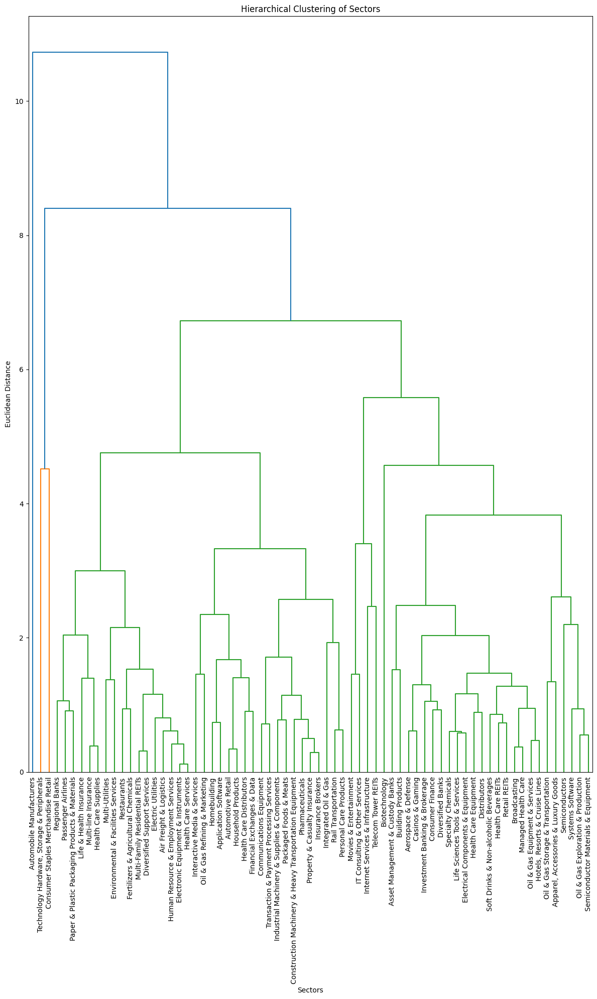

In [13]:
# Step 1: Read the CSV file
df = pd.read_csv('sector_rankings.csv')

# Step 2: Normalize each column independently (excluding the 'Sector' column)
scaler = StandardScaler()
df = df.drop(columns=['Number_of_Companies', 'Date_Range'])
X = df.drop('Sector', axis=1)  # Keep only numerical data for normalization
print(df.shape)
X_scaled = X.apply(lambda col: scaler.fit_transform(col.values.reshape(-1, 1)).flatten(), axis=0)

# Step 3: Perform hierarchical clustering
Z = linkage(X_scaled, method='complete')

# Step 4: Plot the dendrogram
plt.figure(figsize=(12, 20))
dendrogram(Z, labels=df['Sector'].values, leaf_rotation=90, leaf_font_size=10)
plt.title('Hierarchical Clustering of Sectors')
plt.xlabel('Sectors')
plt.ylabel('Euclidean Distance')
plt.tight_layout()
plt.show()


#### Using K-means seeded with the sectors with minimum distance in each cluster, we initialize the clusters and obtain expected output for each sector

Iteration 1, centroid shift: 2.258813
Iteration 2, centroid shift: 0.156812
Iteration 3, centroid shift: 0.146062
Iteration 4, centroid shift: 0.086454
Iteration 5, centroid shift: 0.000000
Convergence reached.
4


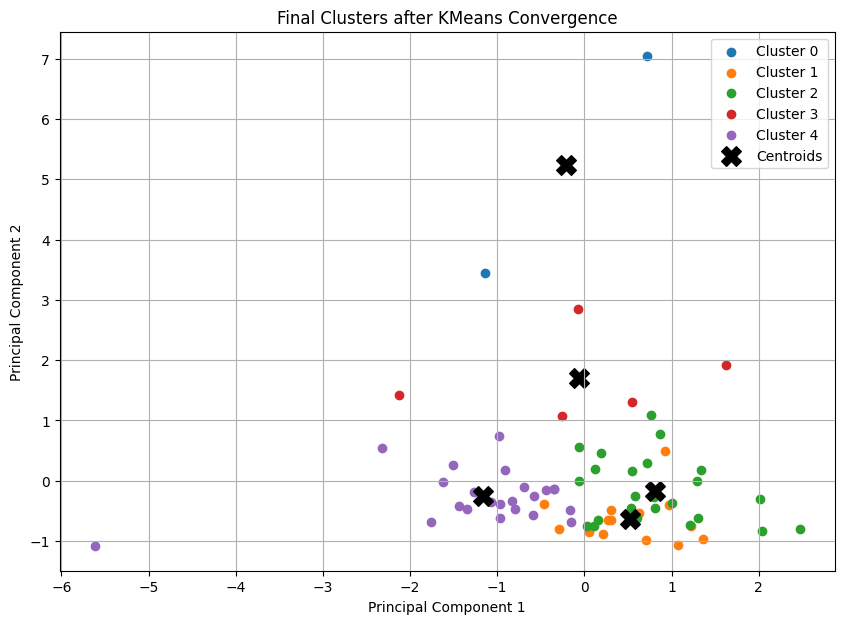

In [14]:
warnings.filterwarnings("ignore")  # Ignore warnings for cleaner output

# Step 1: Load and preprocess the data
df = pd.read_csv('sector_rankings.csv')
df = df.drop(columns=['Number_of_Companies', 'Date_Range'])  # Drop unnecessary columns

# Separate 'Sector' column for labeling
sectors = df['Sector'].values
X = df.drop('Sector', axis=1)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 2: Define seed sectors and calculate initial centroids
seed_sectors = {
    0: "Consumer Staples Merchandise Retail",
    1: "Health Care Services",
    2: "Insurance Brokers",
    3: "Movies & Entertainment",
    4: "Broadcasting"
}

# Find the rows corresponding to the seed sectors
seed_indices = [list(sectors).index(seed) for seed in seed_sectors.values()]
initial_centroids = X_scaled[seed_indices]

# Step 3: Iteratively perform KMeans until convergence
num_clusters = 5
centroids = initial_centroids
tolerance = 1e-4  # Convergence threshold
max_iterations = 100  # Safety limit on iterations
iteration = 0

while iteration < max_iterations:
    # Step 3a: Assign each point to the nearest centroid
    labels, _ = pairwise_distances_argmin_min(X_scaled, centroids)
    
    # Step 3b: Calculate new centroids as the mean of points in each cluster
    new_centroids = np.array([X_scaled[labels == k].mean(axis=0) for k in range(num_clusters)])
    
    # Step 3c: Check for convergence (if centroids do not change significantly)
    centroid_shift = np.linalg.norm(new_centroids - centroids, axis=1).max()
    print(f"Iteration {iteration + 1}, centroid shift: {centroid_shift:.6f}")
    
    if centroid_shift < tolerance:
        print("Convergence reached.")
        break
    
    centroids = new_centroids
    iteration += 1

# Final labels after convergence
final_labels = labels

# Step 4: Reduce dimensions for plotting using PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
centroids_pca = pca.transform(centroids)

# Step 5: Plot the final clusters
plt.figure(figsize=(10, 7))
for cluster in range(num_clusters):
    # Plot points in each cluster
    cluster_points = X_pca[final_labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f"Cluster {cluster}")

print(cluster)
# Plot centroids
plt.scatter(centroids_pca[:, 0], centroids_pca[:, 1], s=200, c='black', marker='X', label='Centroids')

# Add labels and title
plt.title("Final Clusters after KMeans Convergence")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.grid(True)
plt.show()


#### Model Architecture
```python
Sequential([
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(num_clusters, activation='softmax')
])

In [15]:
# Step 1: Load and preprocess the data
df = pd.read_csv('sector_rankings.csv')
df = df.drop(columns=['Number_of_Companies', 'Date_Range'])  # Drop unnecessary columns

# Separate 'Sector' column for labeling and features
sectors = df['Sector'].values
X = df.drop('Sector', axis=1)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 2: Generate cluster labels with KMeans
num_clusters = 5
# seed_sectors = {
#     0: "Internet Services & Infrastructure",
#     1: "Oil & Gas Exploration & Production",
#     2: "Interactive Media & Services",
#     3: "Broadcasting",
#     4: "Rail Transportation"
# }
seed_sectors = {
    0: "Consumer Staples Merchandise Retail",
    1: "Health Care Services",
    2: "Insurance Brokers",
    3: "Movies & Entertainment",
    4: "Broadcasting"
}

# Find the rows corresponding to the seed sectors
seed_indices = [list(sectors).index(seed) for seed in seed_sectors.values()]
initial_centroids = X_scaled[seed_indices]

# Initialize and fit KMeans
kmeans = KMeans(n_clusters=num_clusters, init=initial_centroids, n_init=1)
kmeans.fit(X_scaled)
labels = kmeans.labels_  # Use these labels as the target for training

# Step 3: Prepare data for the neural network
# Convert labels to categorical (one-hot encoding)
y = to_categorical(labels, num_clusters)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.4, random_state=42)

# Step 4: Build the neural network model
model = Sequential([
    Dense(128, input_shape=(X_train.shape[1],), activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(num_clusters, activation='softmax')  # Output layer with softmax for classification
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Step 5: Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=8, validation_split=0.3, verbose=1)

# Step 6: Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Predict clusters for new data points
predictions = model.predict(X_test)
predicted_clusters = np.argmax(predictions, axis=1)

# Output some test predictions
for i in range(len(y_test)):  # Show first 5 predictions
    print(f"{i}.True cluster: {np.argmax(y_test[i])}, Predicted cluster: {predicted_clusters[i]}")


Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.0738 - loss: 1.6135 - val_accuracy: 0.2308 - val_loss: 1.5785
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6571 - loss: 1.5233 - val_accuracy: 0.3077 - val_loss: 1.5246
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7024 - loss: 1.4533 - val_accuracy: 0.6154 - val_loss: 1.4709
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.9071 - loss: 1.3443 - val_accuracy: 0.6154 - val_loss: 1.4212
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.9363 - loss: 1.2555 - val_accuracy: 0.6923 - val_loss: 1.3715
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8929 - loss: 1.1702 - val_accuracy: 0.6923 - val_loss: 1.3294
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8946 - loss: 1.0373 - val_accuracy: 0.6923 - val_loss: 1.3012
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8798 - loss: 0.9544 - val_accuracy: 0.6923 - val_loss:

## Save the model

In [16]:
model.save("sector_classification_model.keras")